In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with distance noise added (simulation=7)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['0','0','0','0','1']
improvement_factor=1
effect_strength=1
chance_companion=0.01
remove_likely_binaries='0'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


51.17 0.0013


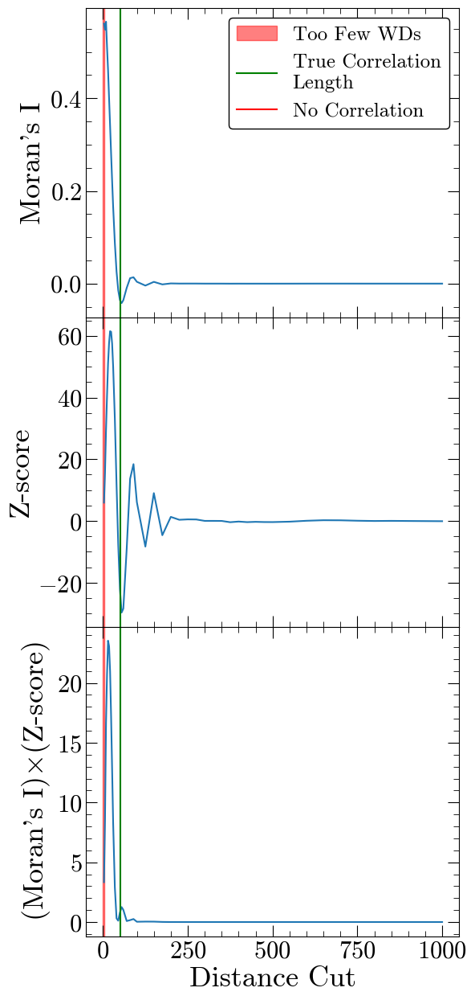

464.16 0.034


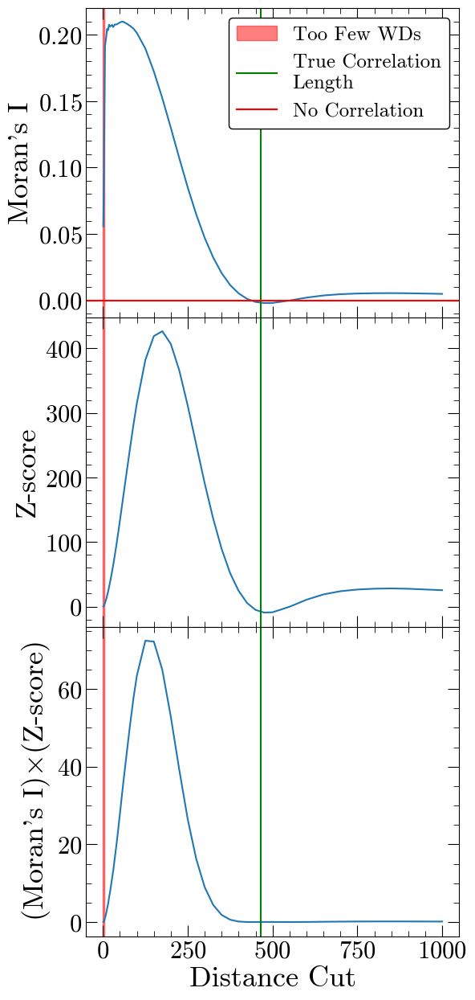

475.08 0.00043


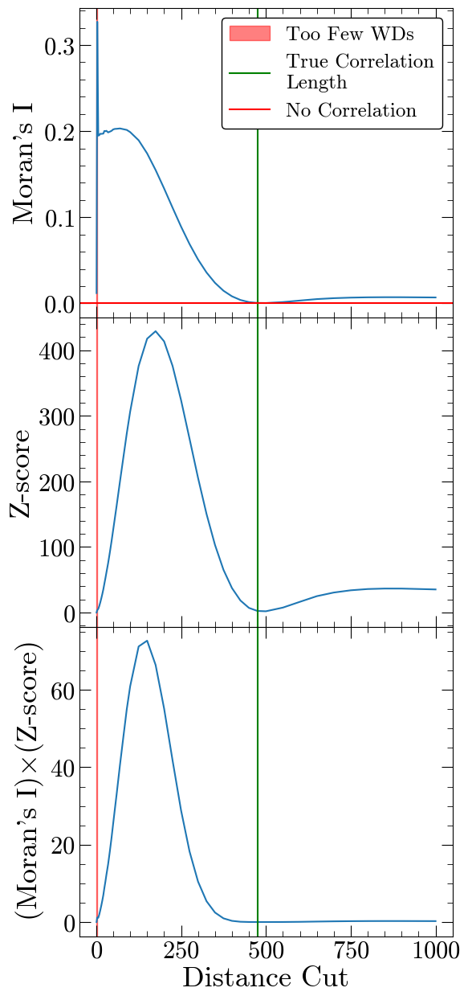

159.23 0.1


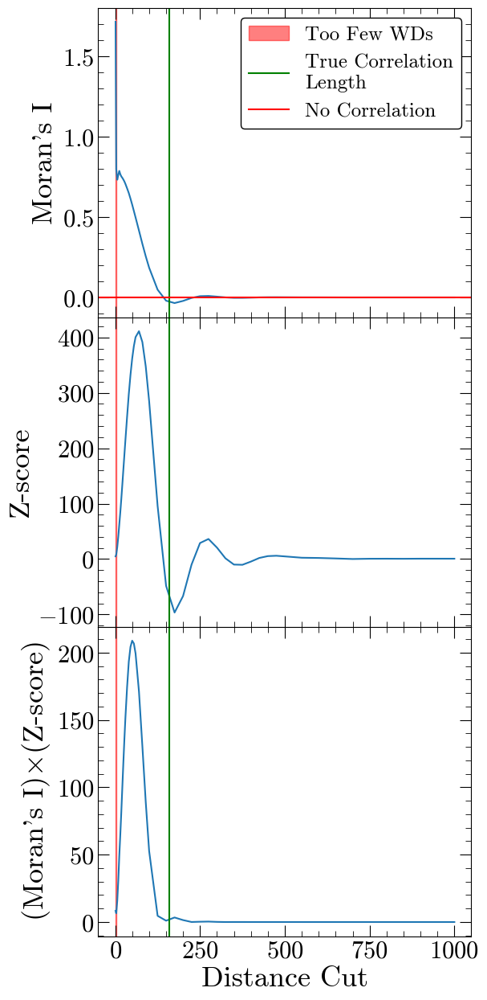

84.62 0.0013


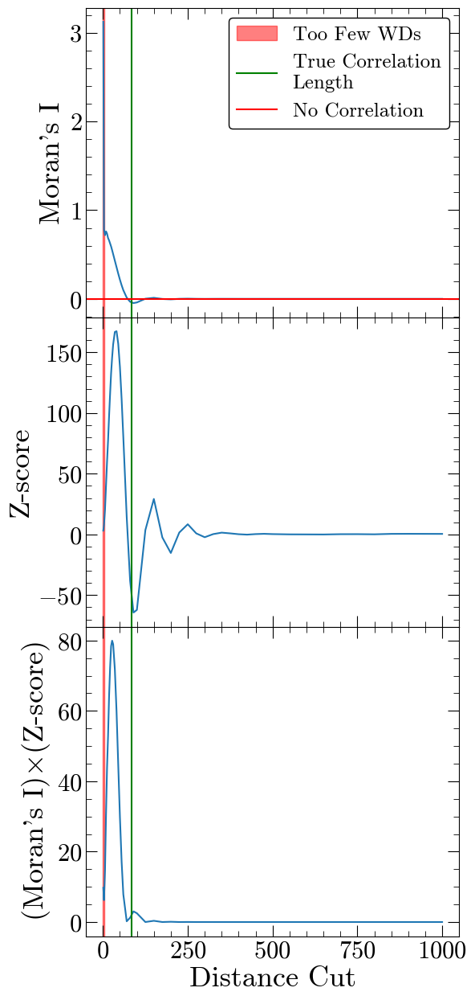

792.48 0.23


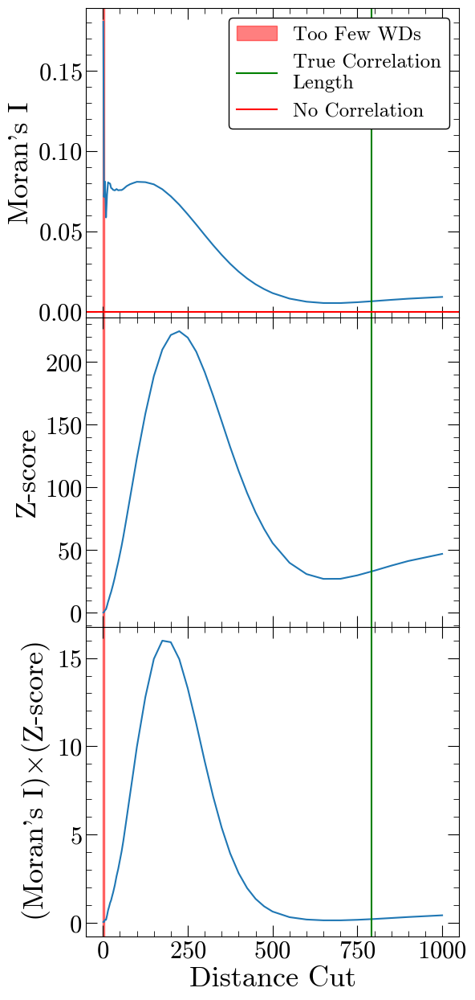

585.7 1e-10


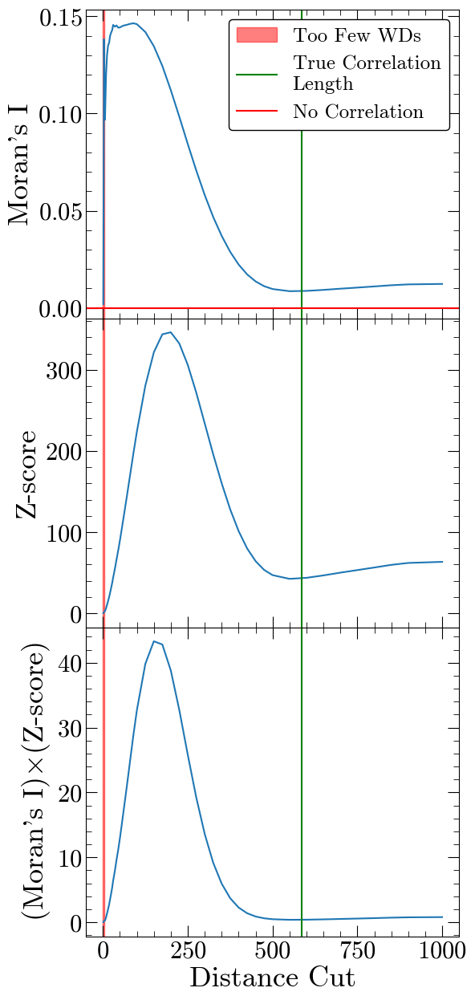

84.62 1.8e-06


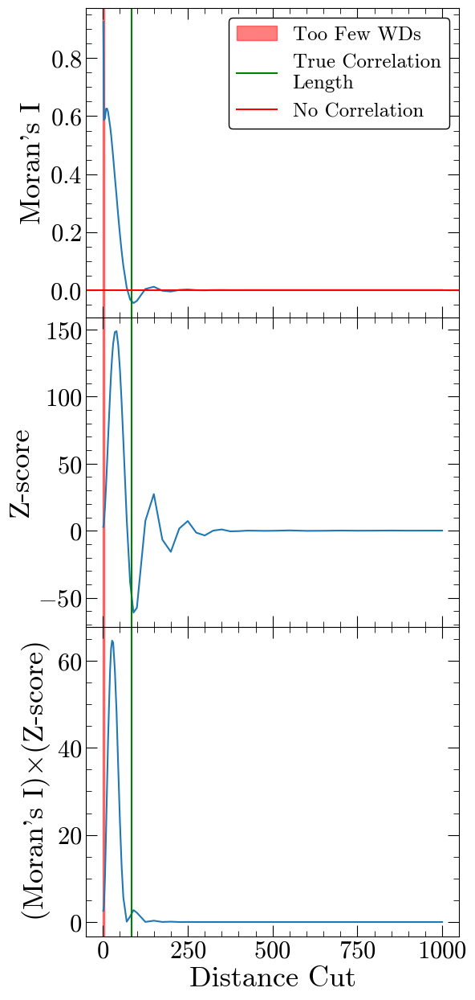

673.42 0.0013


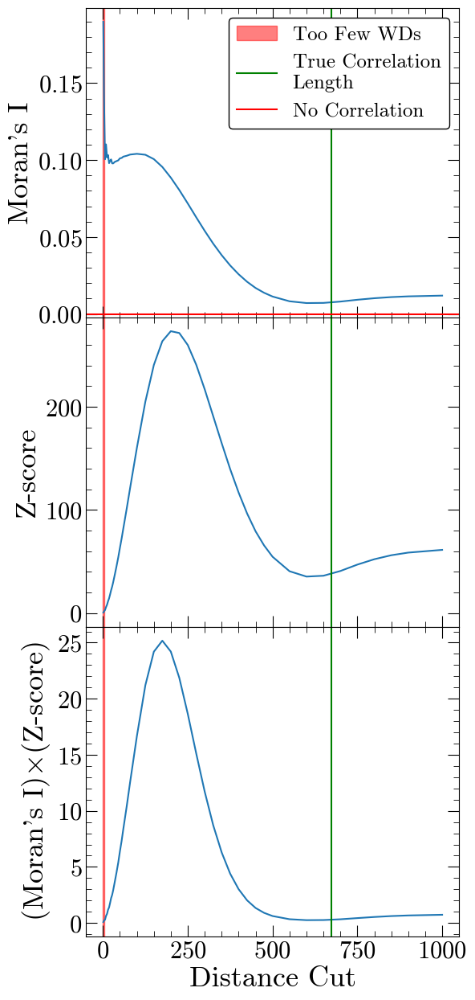

166.81 0.23


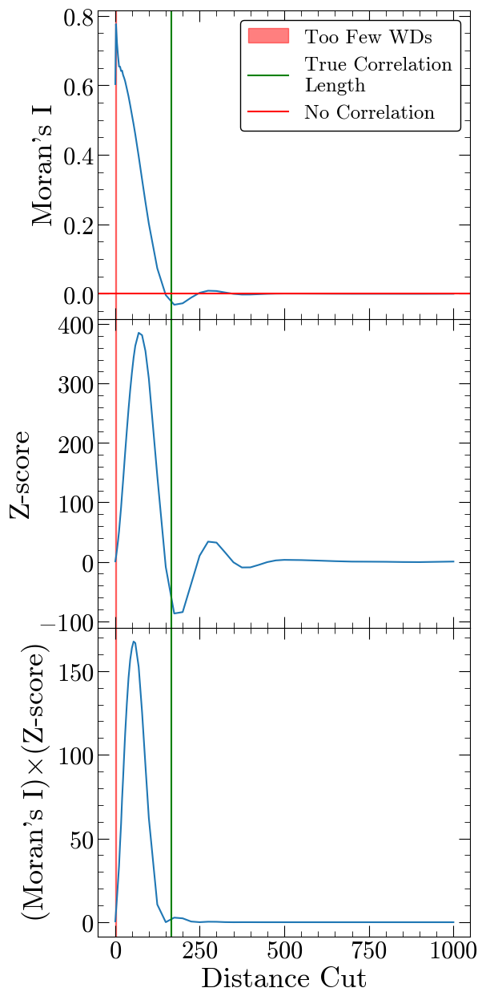

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

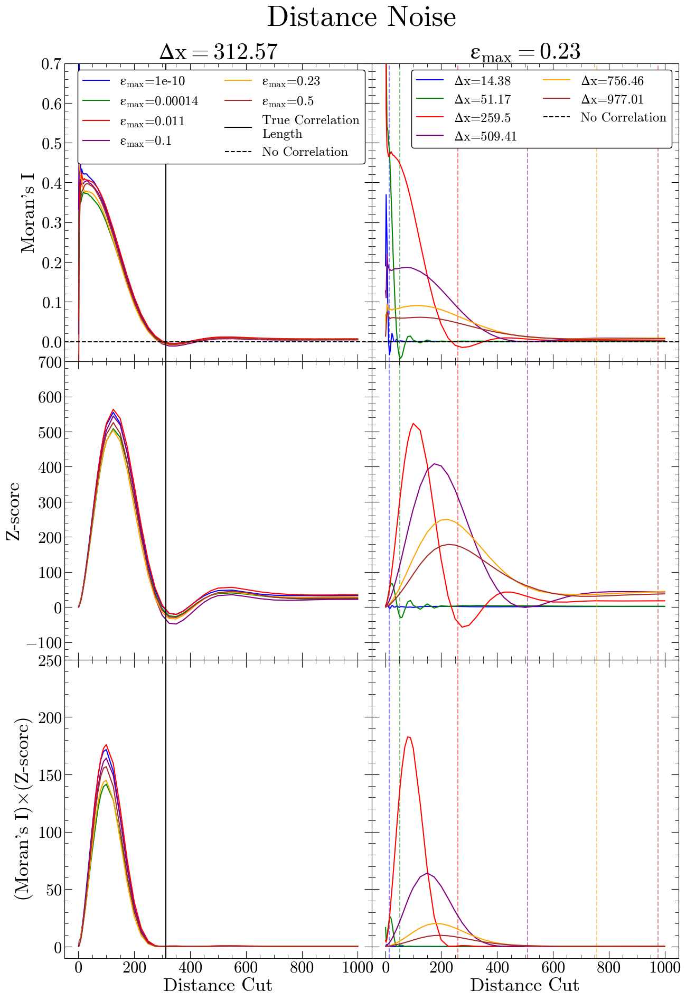

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.1,0.23,0.5]#[1e-10,2.1e-07,0.00014,0.034,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.23
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.05,0.7)
ax4.set_ylim(-0.05,0.7)

ax2.set_ylim(-150,700)
ax5.set_ylim(-150,700)

ax3.set_ylim(-10,250)
ax6.set_ylim(-10,250)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('Distance Noise', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_distance_noise.pdf', dpi=300)#, pad_inches=0.3)

Text(0.5, 1.0, '$\\Delta x=$312.57')

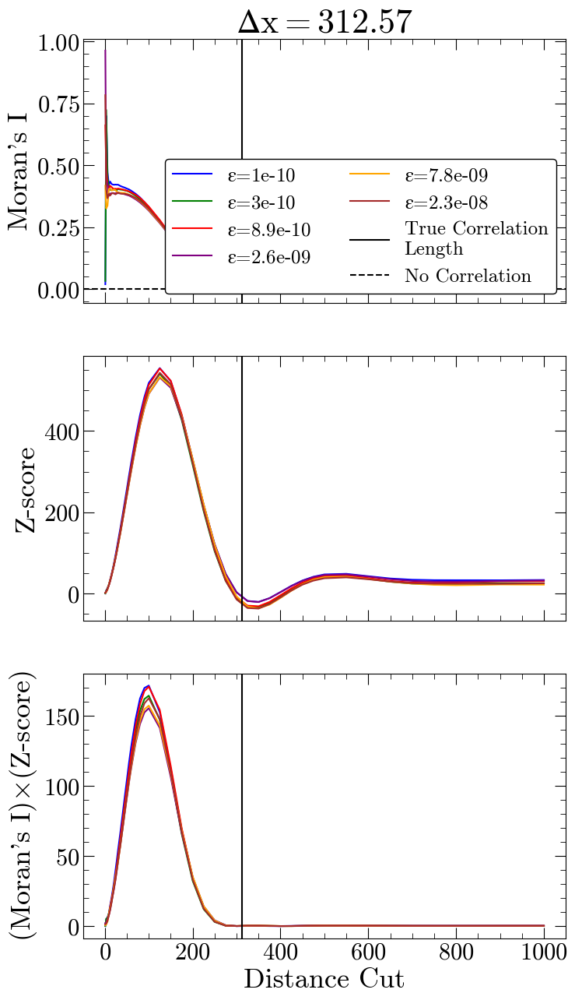

In [8]:
#find minimum visible epsilon

#min=1e-10
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,3e-10,8.9e-10,2.6e-09,7.8e-09,2.3e-08]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
 

# Set up the training and testing data for the CNN

In [9]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [10]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [28]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [29]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [30]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [44]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 1s 4ms/step - loss: 108847.4922
Epoch 2/100
92/92 [==============================] - 0s 5ms/step - loss: 12732.3857
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 2555.2615
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 1469.5895
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 957.0536
Epoch 6/100
92/92 [==============================] - 0s 5ms/step - loss: 736.8172
Epoch 7/100
92/92 [==============================] - 0s 5ms/step - loss: 617.6517
Epoch 8/100
92/92 [==============================] - 0s 5ms/step - loss: 549.7252
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 510.0566
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 465.0009
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 443.3247
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 420.9199
Epoch 

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 18.387 pc
MAE: 3.574 pc
BIAS: -3.026 pc
MED FRAC ERR: 0.021 

Training Stats, Successful Fits
Frac Success Fit: 0.955 
RMSE: 14.372 pc
MAE: 3.528 pc
BIAS: -2.968 pc
MED FRAC ERR: 0.020 

Testing Stats
RMSE: 21.017 pc
MAE: 3.522 pc
BIAS: -2.443 pc
MED FRAC ERR: 0.021 

Testing Stats, Successful Fits
Frac Success Fit: 0.934 
RMSE: 18.531 pc
MAE: 3.615 pc
BIAS: -2.354 pc
MED FRAC ERR: 0.019 


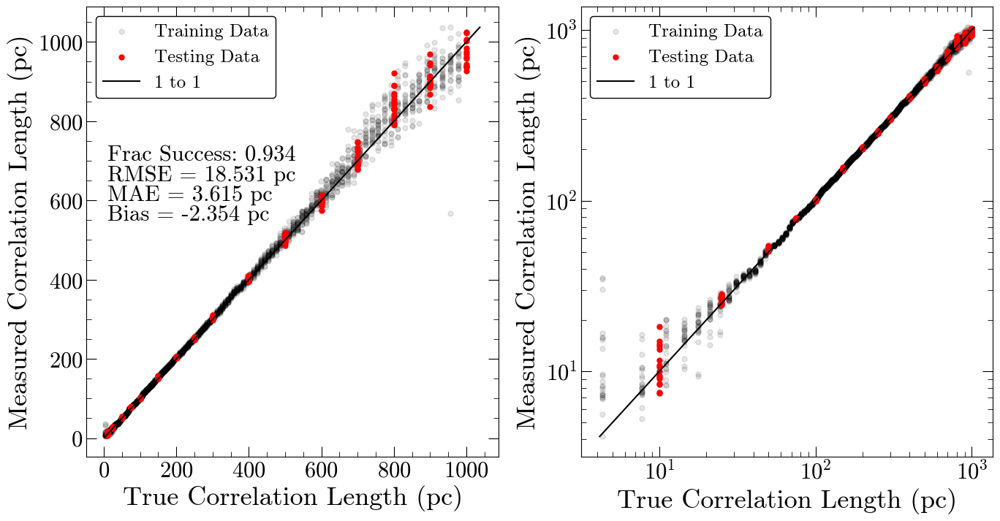

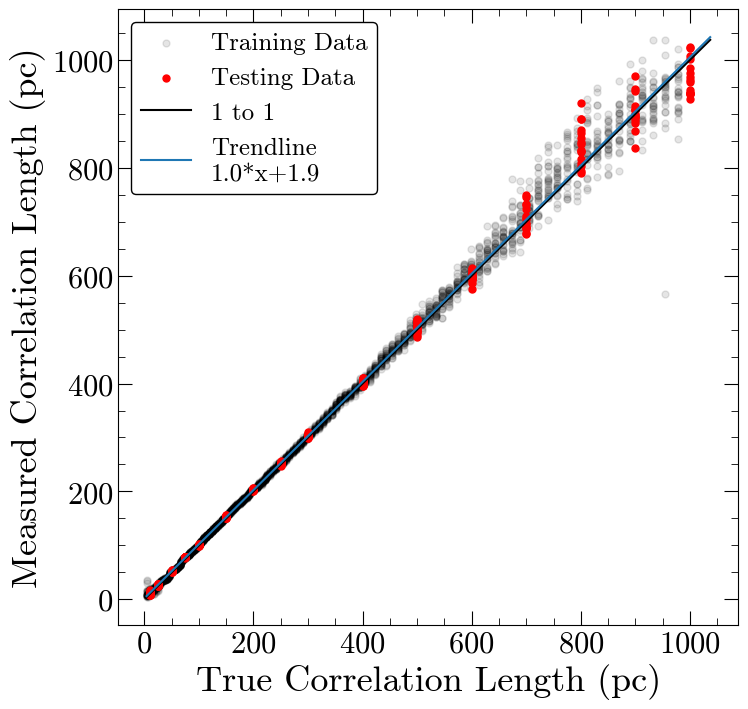

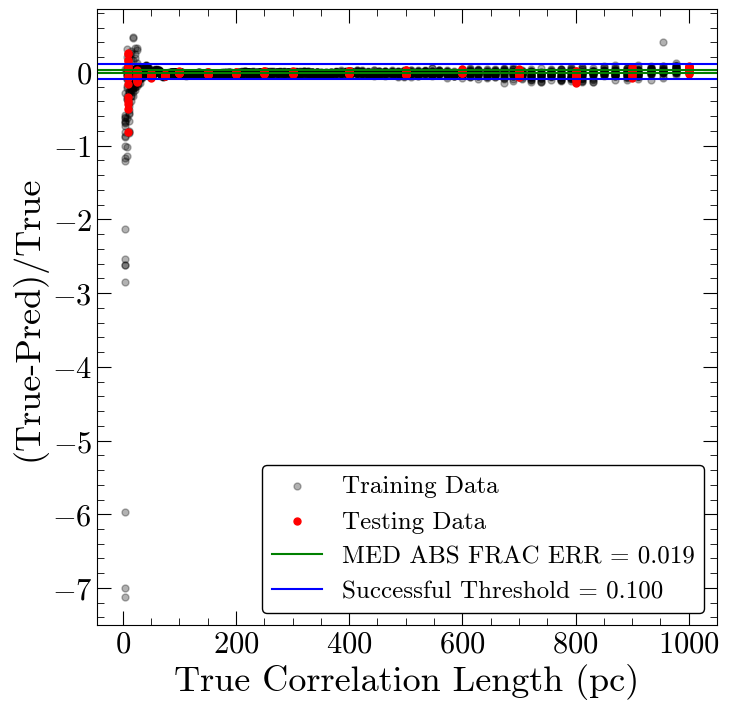

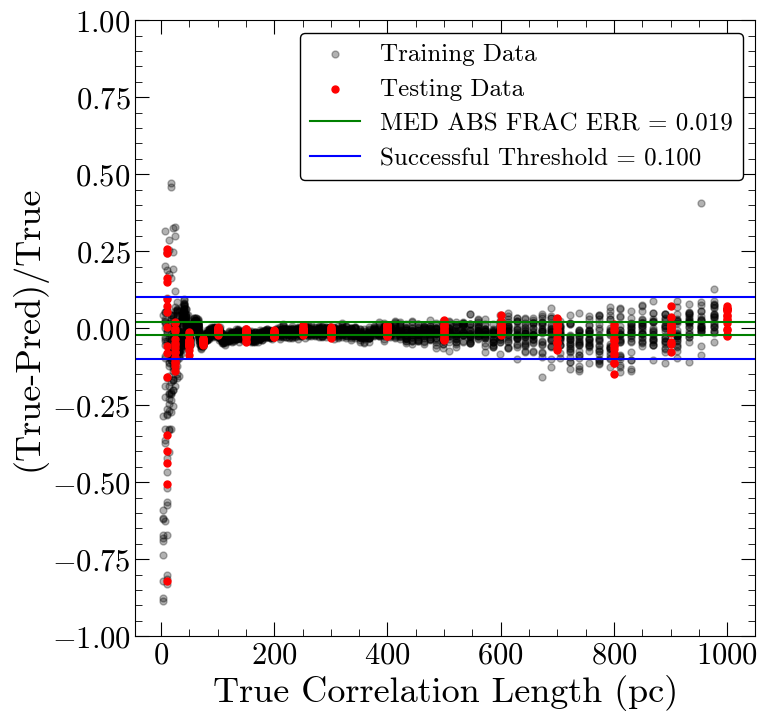

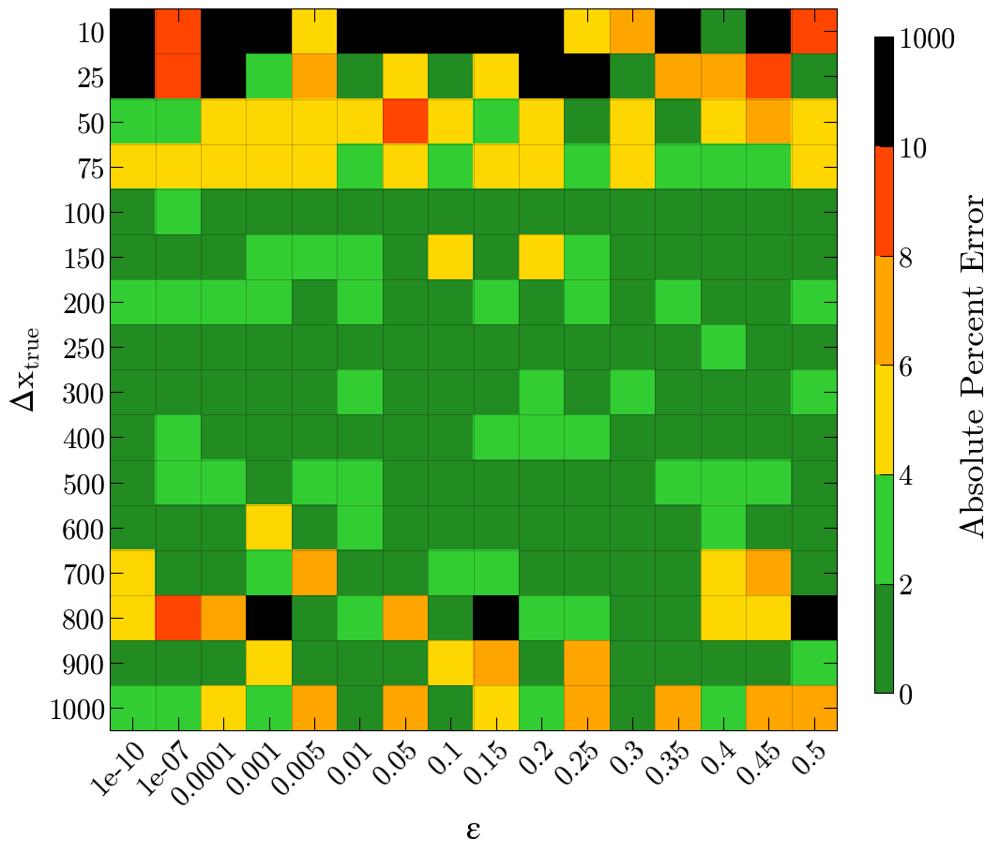

Number of squares with abs percent err>10%,  17


In [32]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 1s 7ms/step - loss: 105688.9375
Epoch 2/200
92/92 [==============================] - 1s 8ms/step - loss: 11680.6846
Epoch 3/200
92/92 [==============================] - 1s 8ms/step - loss: 2141.4814
Epoch 4/200
92/92 [==============================] - 1s 8ms/step - loss: 1075.9586
Epoch 5/200
92/92 [==============================] - 1s 11ms/step - loss: 784.1674
Epoch 6/200
92/92 [==============================] - 1s 7ms/step - loss: 643.1941
Epoch 7/200
92/92 [==============================] - 1s 9ms/step - loss: 550.2643
Epoch 8/200
92/92 [==============================] - 1s 9ms/step - loss: 494.5532
Epoch 9/200
92/92 [==============================] - 1s 8ms/step - loss: 444.7299
Epoch 10/200
92/92 [==============================] - 1s 8ms/step - loss: 421.9712
Epoch 11/200
92/92 [==============================] - 1s 8ms/step - loss: 406.9914
Epoch 12/200
92/92 [==============================] - 1s 9ms/step - loss: 393.7289
Epoch

92/92 [==============================] - 1s 11ms/step - loss: 308.0591
Epoch 197/200
92/92 [==============================] - 1s 9ms/step - loss: 271.7402
Epoch 198/200
92/92 [==============================] - 1s 10ms/step - loss: 266.7067
Epoch 199/200
92/92 [==============================] - 1s 7ms/step - loss: 263.1361
Epoch 200/200
92/92 [==============================] - 1s 9ms/step - loss: 269.8165

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 18.773 pc
MAE: 4.781 pc
BIAS: 3.866 pc
MED FRAC ERR: 0.026 

Training Stats, Successful Fits
Frac Success Fit: 0.949 
RMSE: 17.261 pc
MAE: 4.980 pc
BIAS: 3.921 pc
MED FRAC ERR: 0.025 

Testing Stats
RMSE: 25.778 pc
MAE: 6.146 pc
BIAS: 4.261 pc
MED FRAC ERR: 0.029 

Testing Stats, Successful Fits
Frac Success Fit: 0.934 
RMSE: 24.831 pc
MAE: 6.946 pc
BIAS: 5.213 pc
MED FRAC ERR: 0.027 


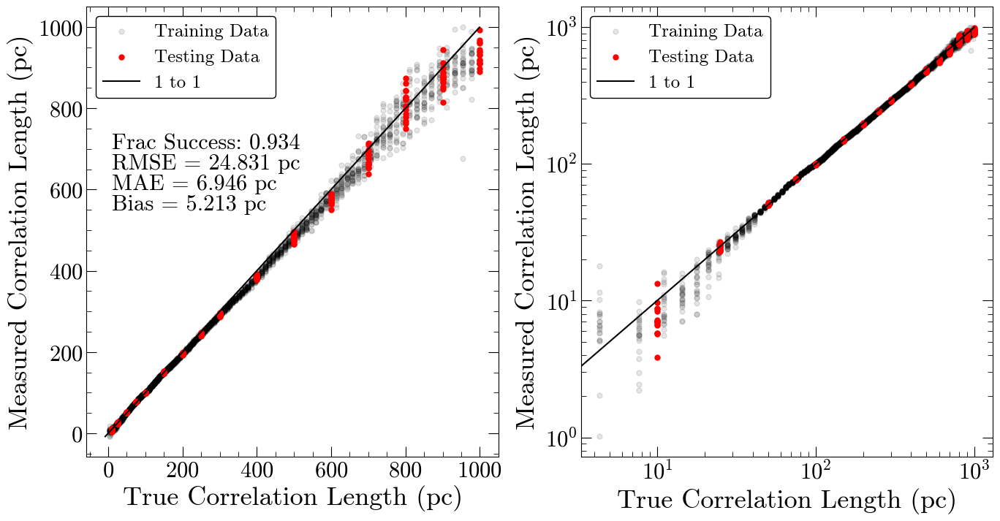

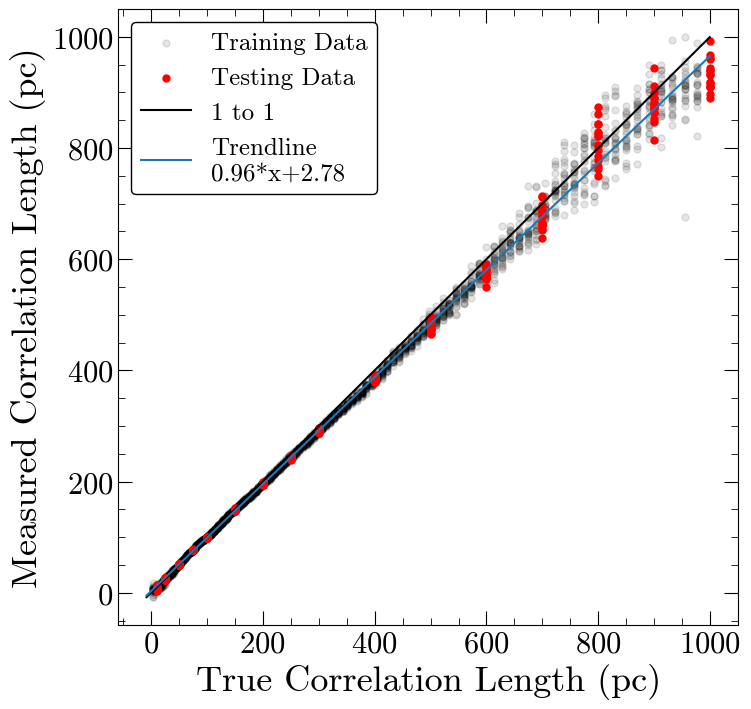

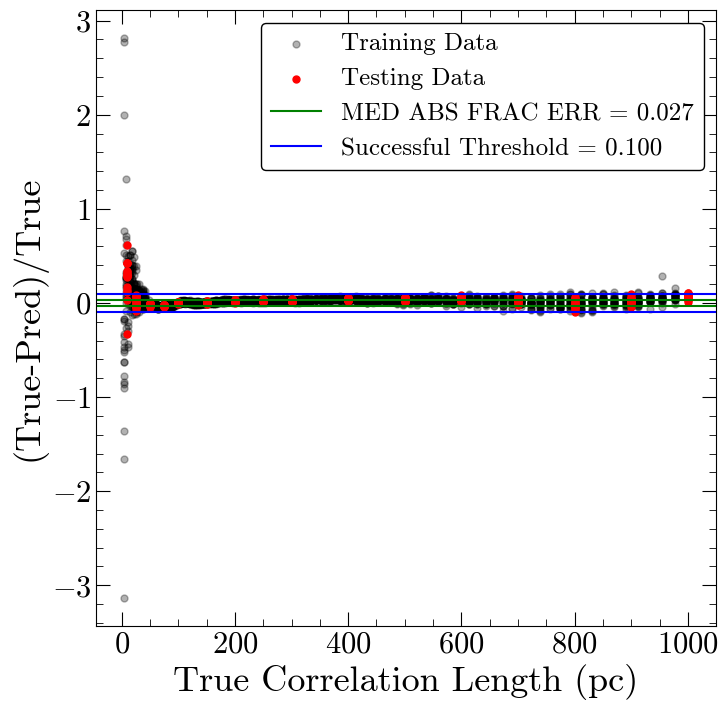

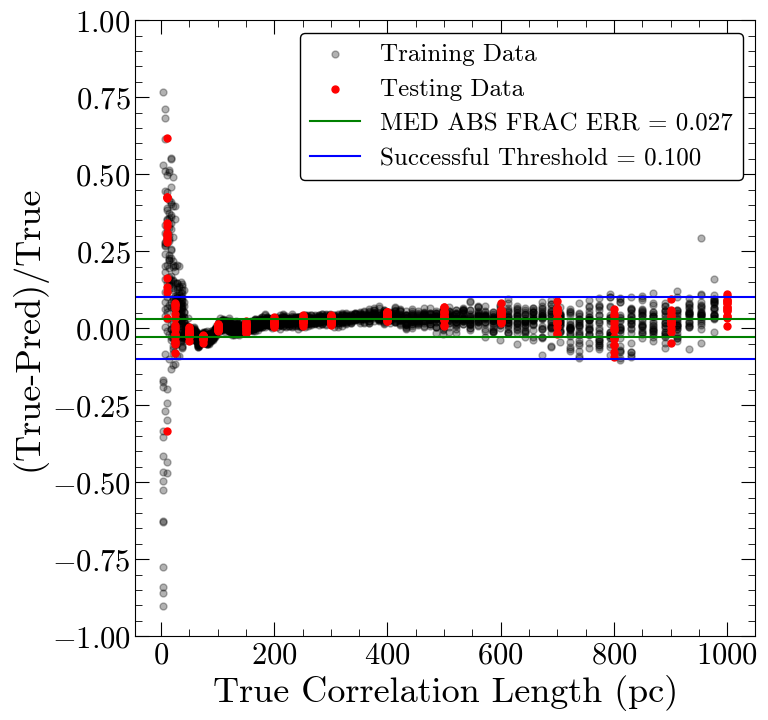

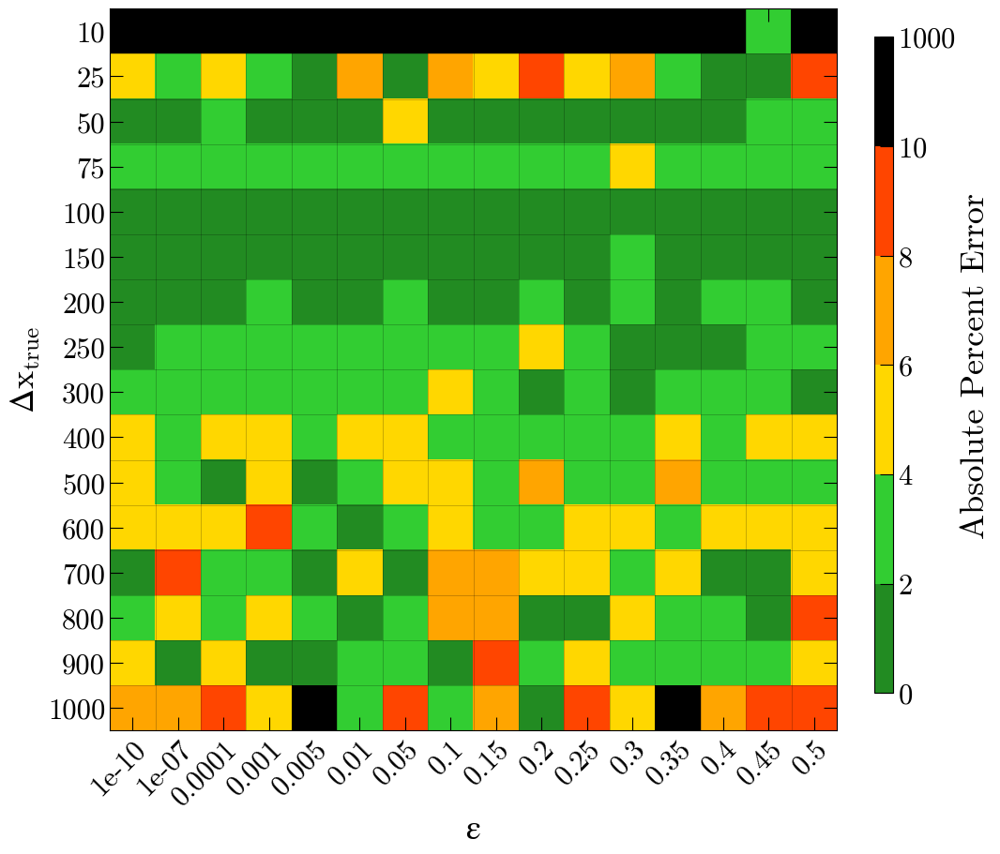

Number of squares with abs percent err>10%,  17


In [33]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 10ms/step - loss: 75377.3906
Epoch 2/100
92/92 [==============================] - 1s 12ms/step - loss: 2633.9683
Epoch 3/100
92/92 [==============================] - 1s 9ms/step - loss: 1028.1312
Epoch 4/100
92/92 [==============================] - 1s 8ms/step - loss: 709.1060
Epoch 5/100
92/92 [==============================] - 1s 8ms/step - loss: 558.5873
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 491.7525
Epoch 7/100
92/92 [==============================] - 1s 8ms/step - loss: 467.7224
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 418.4955
Epoch 9/100
92/92 [==============================] - 1s 8ms/step - loss: 463.3708
Epoch 10/100
92/92 [==============================] - 1s 8ms/step - loss: 420.0577
Epoch 11/100
92/92 [==============================] - 1s 9ms/step - loss: 383.0023
Epoch 12/100
92/92 [==============================] - 1s 9ms/step - loss: 393.1952
Epoch 1

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 19.527 pc
MAE: 8.900 pc
BIAS: -8.356 pc
MED FRAC ERR: 0.048 

Training Stats, Successful Fits
Frac Success Fit: 0.928 
RMSE: 17.044 pc
MAE: 9.318 pc
BIAS: -8.613 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 22.301 pc
MAE: 8.025 pc
BIAS: -6.170 pc
MED FRAC ERR: 0.047 

Testing Stats, Successful Fits
Frac Success Fit: 0.891 
RMSE: 20.893 pc
MAE: 8.933 pc
BIAS: -7.030 pc
MED FRAC ERR: 0.043 


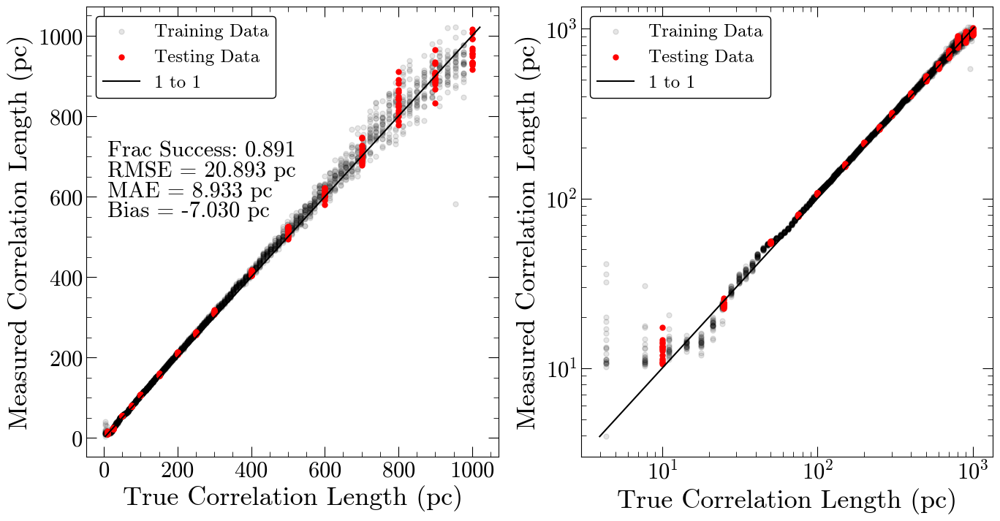

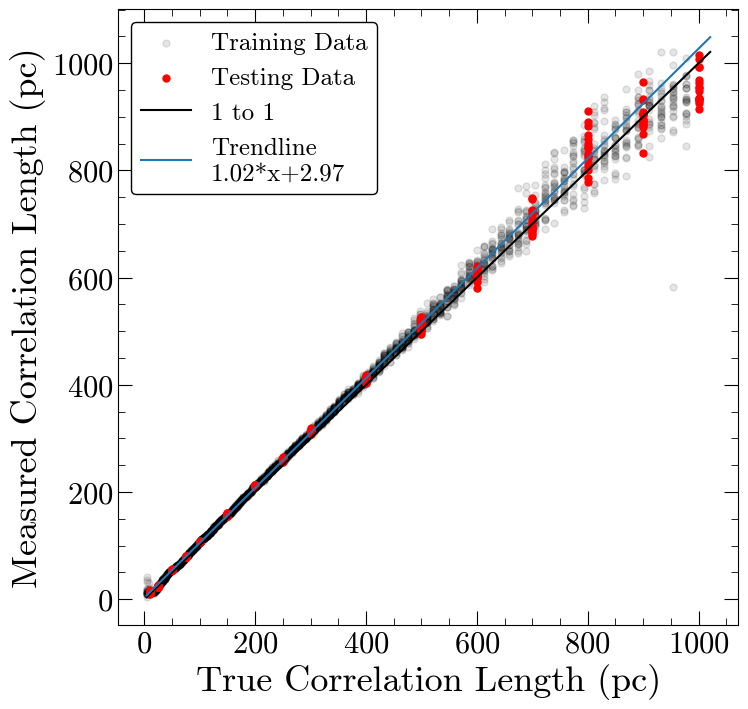

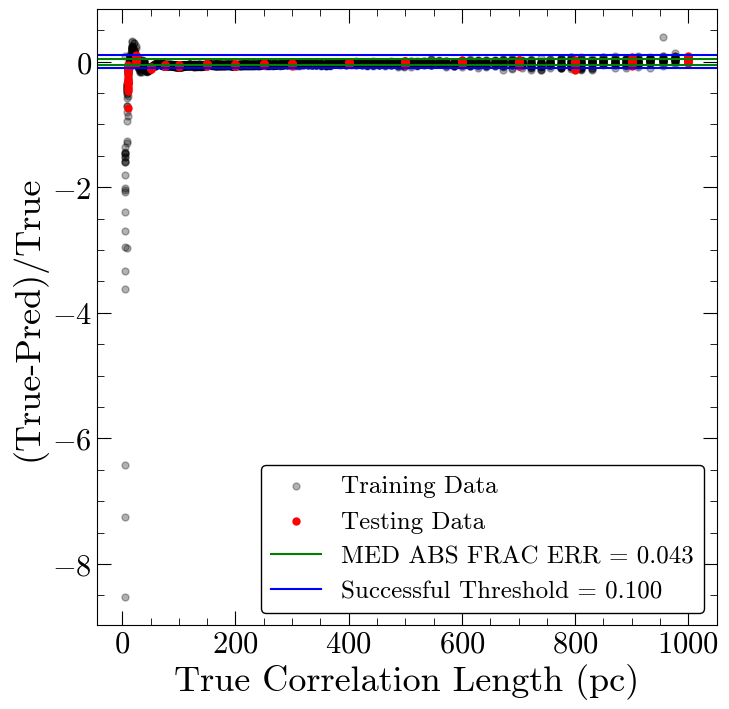

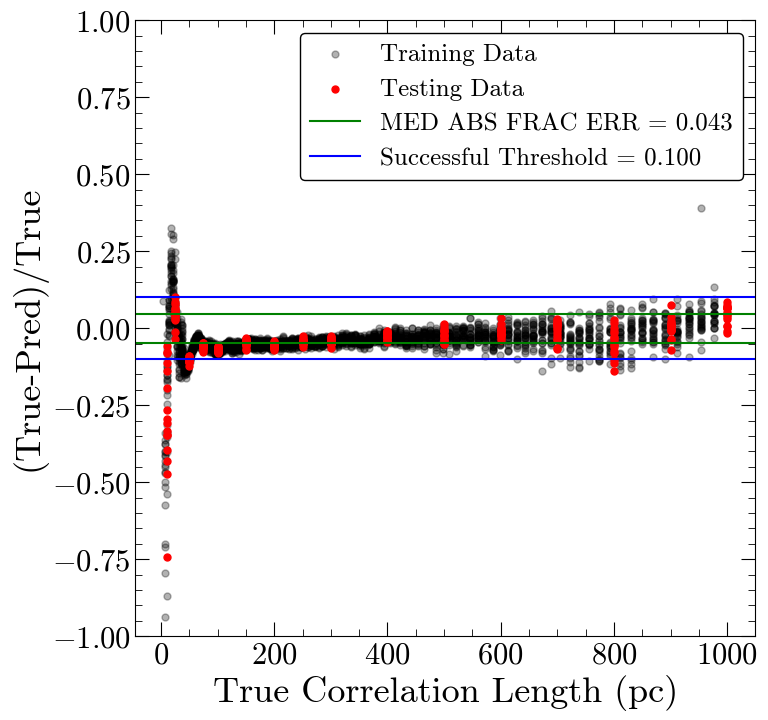

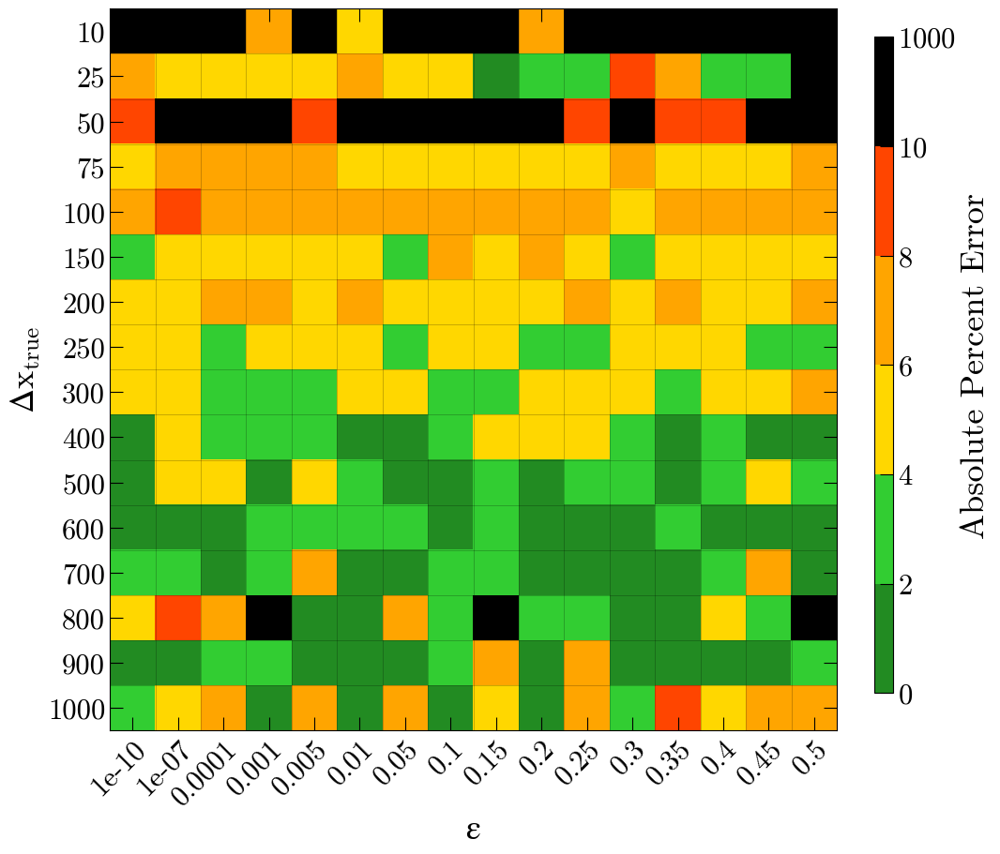

Number of squares with abs percent err>10%,  28


In [34]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 10ms/step - loss: 83100.7266
Epoch 2/200
92/92 [==============================] - 1s 9ms/step - loss: 2680.2139
Epoch 3/200
92/92 [==============================] - 1s 11ms/step - loss: 678.6425
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 512.7783
Epoch 5/200
92/92 [==============================] - 1s 9ms/step - loss: 420.9109
Epoch 6/200
92/92 [==============================] - 1s 10ms/step - loss: 397.0814
Epoch 7/200
92/92 [==============================] - 1s 11ms/step - loss: 376.3001
Epoch 8/200
92/92 [==============================] - 1s 11ms/step - loss: 385.9634
Epoch 9/200
92/92 [==============================] - 1s 13ms/step - loss: 412.8239
Epoch 10/200
92/92 [==============================] - 1s 12ms/step - loss: 375.9380
Epoch 11/200
92/92 [==============================] - 1s 10ms/step - loss: 353.8222
Epoch 12/200
92/92 [==============================] - 1s 9ms/step - loss: 366.0761
Ep

92/92 [==============================] - 1s 9ms/step - loss: 311.4365
Epoch 197/200
92/92 [==============================] - 1s 8ms/step - loss: 280.5420
Epoch 198/200
92/92 [==============================] - 1s 9ms/step - loss: 308.2480
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 267.4191
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 275.4524

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 16.074 pc
MAE: 4.923 pc
BIAS: -4.357 pc
MED FRAC ERR: 0.030 

Training Stats, Successful Fits
Frac Success Fit: 0.965 
RMSE: 14.729 pc
MAE: 4.984 pc
BIAS: -4.420 pc
MED FRAC ERR: 0.030 

Testing Stats
RMSE: 21.817 pc
MAE: 4.763 pc
BIAS: -2.846 pc
MED FRAC ERR: 0.028 

Testing Stats, Successful Fits
Frac Success Fit: 0.938 
RMSE: 19.676 pc
MAE: 5.188 pc
BIAS: -3.014 pc
MED FRAC ERR: 0.026 


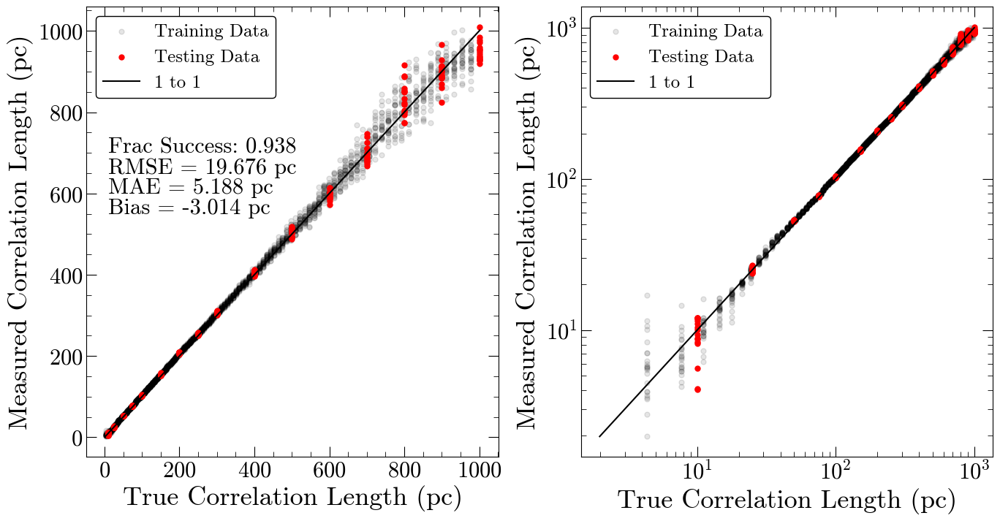

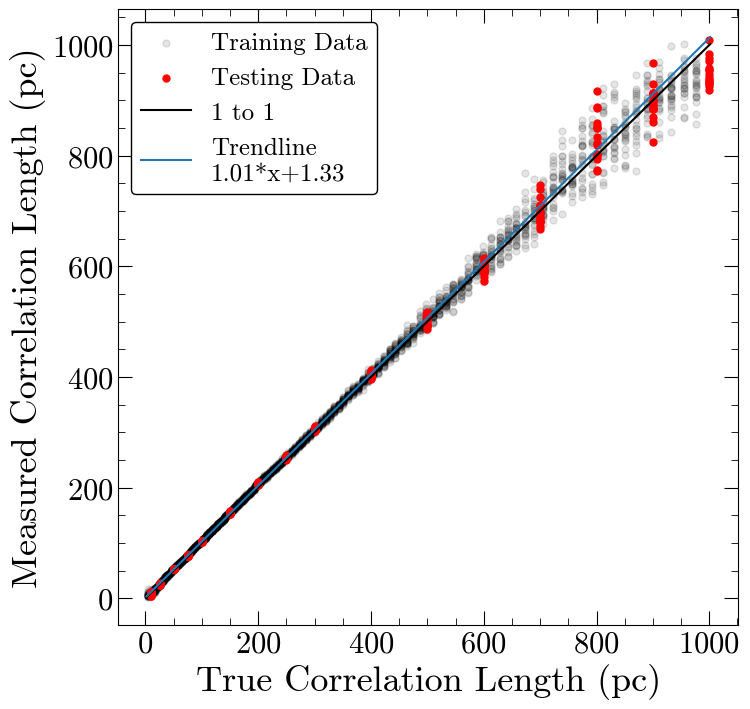

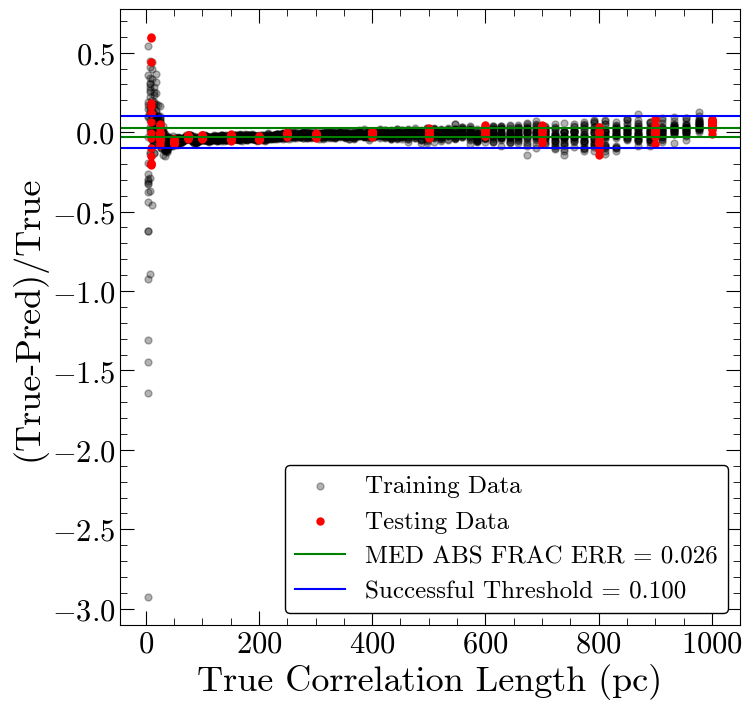

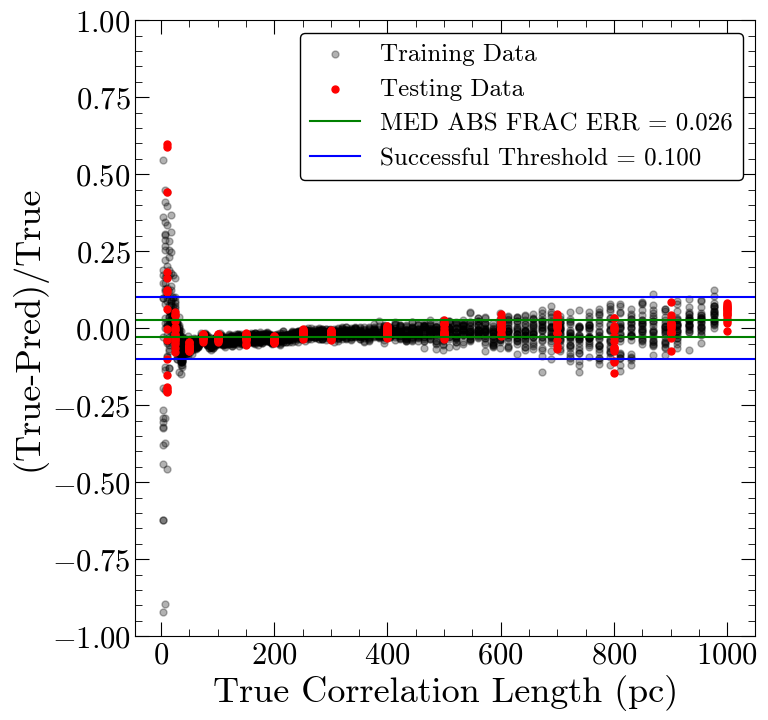

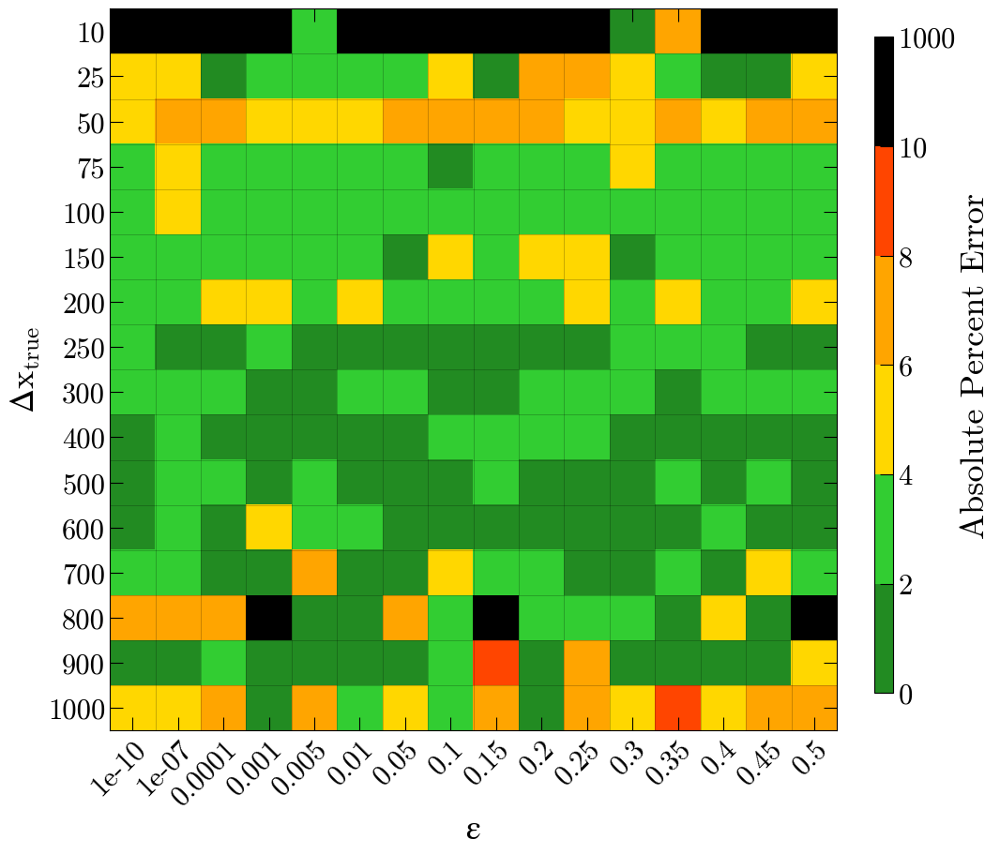

Number of squares with abs percent err>10%,  16


In [35]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 6ms/step - loss: 79747.8047
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 4222.2690
Epoch 3/100
92/92 [==============================] - 1s 7ms/step - loss: 961.1475
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 640.7662
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 517.1517
Epoch 6/100
92/92 [==============================] - 1s 7ms/step - loss: 443.8774
Epoch 7/100
92/92 [==============================] - 1s 6ms/step - loss: 426.7104
Epoch 8/100
92/92 [==============================] - 1s 6ms/step - loss: 490.6773
Epoch 9/100
92/92 [==============================] - 1s 7ms/step - loss: 386.9652
Epoch 10/100
92/92 [==============================] - 1s 7ms/step - loss: 394.1767
Epoch 11/100
92/92 [==============================] - 1s 7ms/step - loss: 382.4430
Epoch 12/100
92/92 [==============================] - 1s 7ms/step - loss: 427.6069
Epoch 13/1

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 20.192 pc
MAE: 4.861 pc
BIAS: 4.427 pc
MED FRAC ERR: 0.027 

Training Stats, Successful Fits
Frac Success Fit: 0.939 
RMSE: 17.200 pc
MAE: 4.986 pc
BIAS: 4.523 pc
MED FRAC ERR: 0.026 

Testing Stats
RMSE: 29.986 pc
MAE: 5.508 pc
BIAS: 4.611 pc
MED FRAC ERR: 0.030 

Testing Stats, Successful Fits
Frac Success Fit: 0.914 
RMSE: 24.680 pc
MAE: 5.758 pc
BIAS: 5.184 pc
MED FRAC ERR: 0.028 


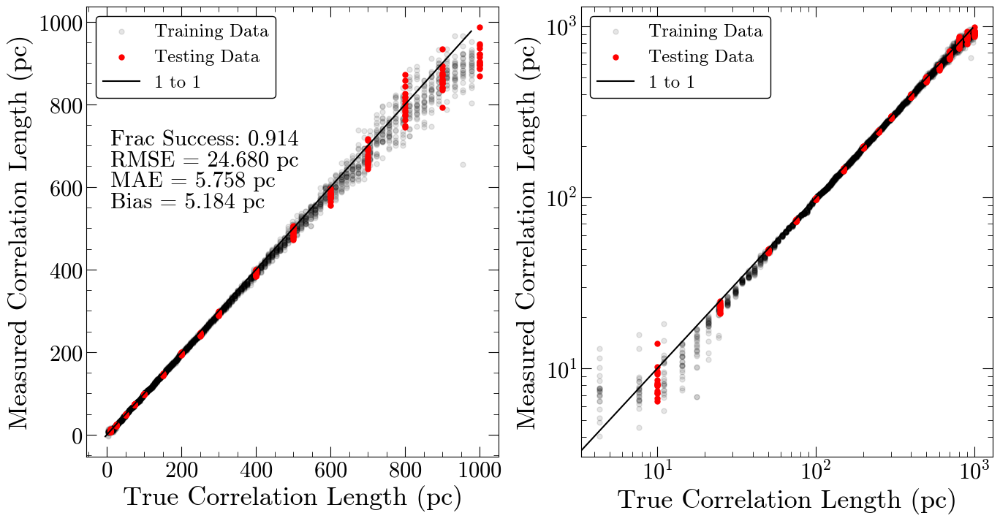

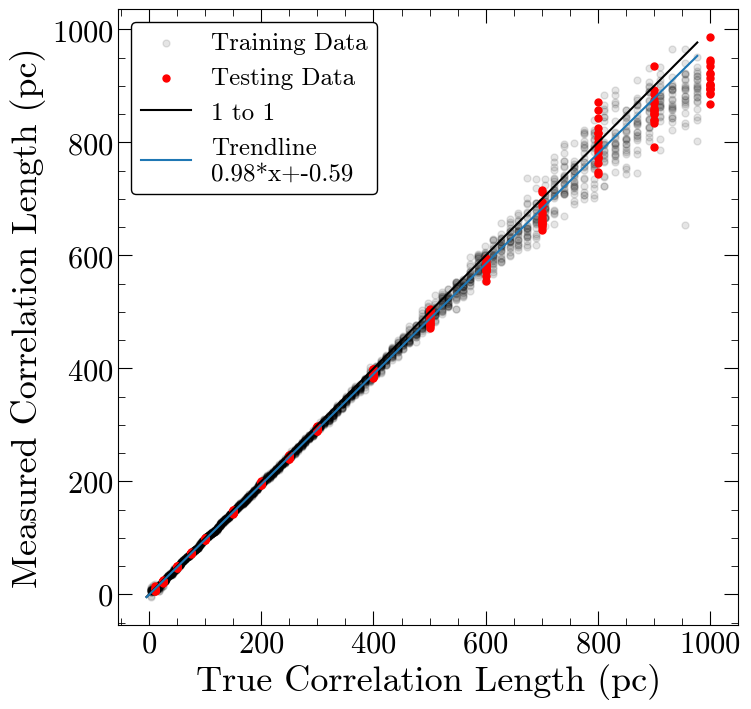

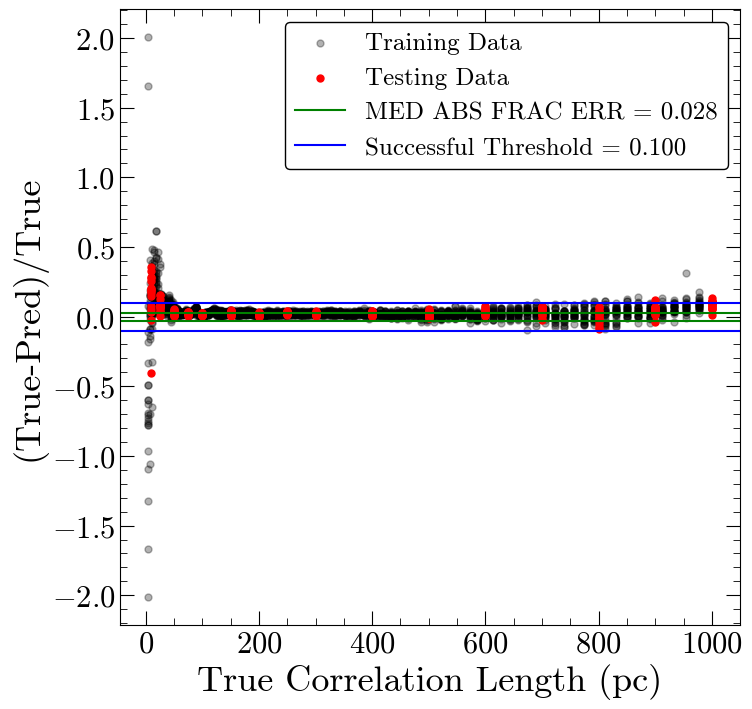

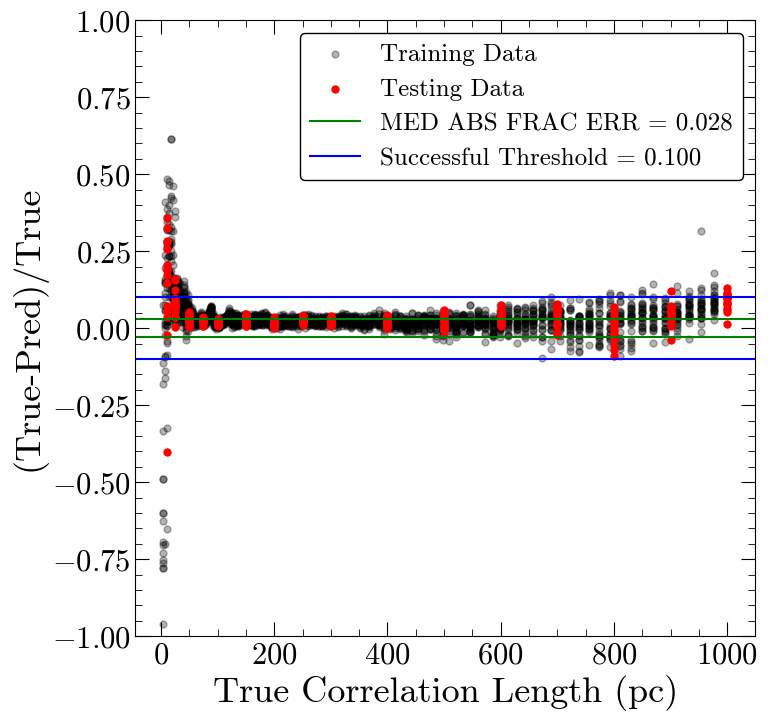

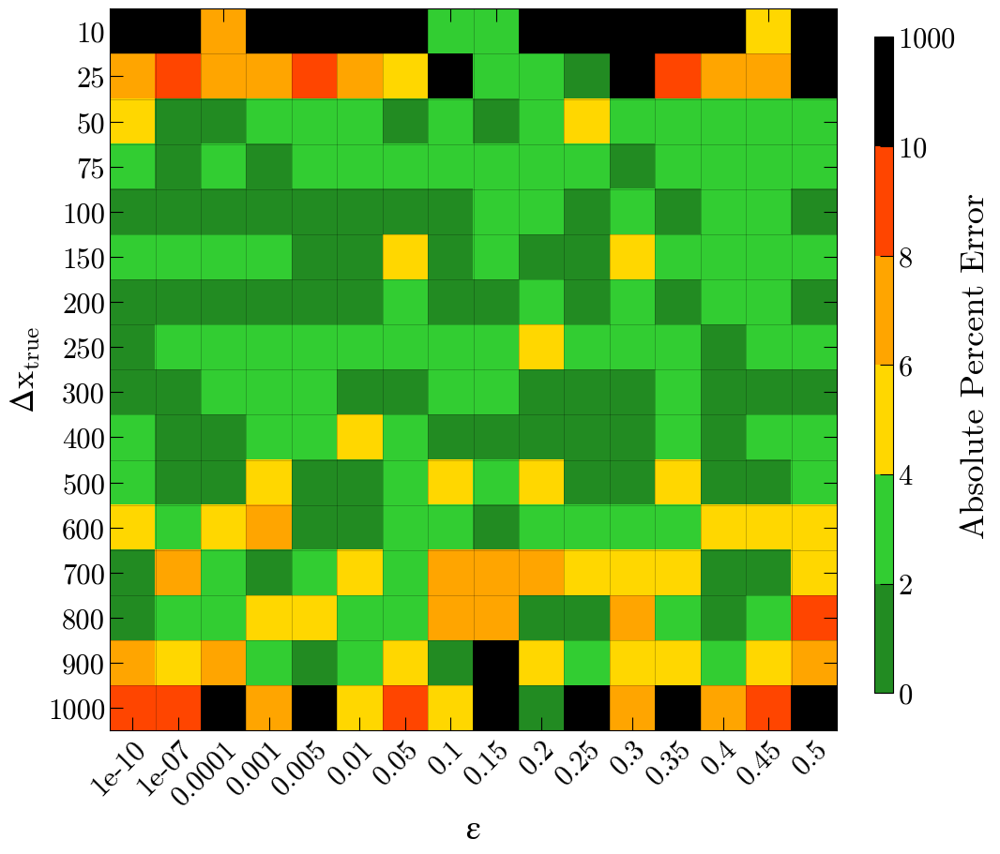

Number of squares with abs percent err>10%,  22


In [36]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 7ms/step - loss: 76225.0781
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 4026.2449
Epoch 3/100
92/92 [==============================] - 1s 8ms/step - loss: 605.2119
Epoch 4/100
92/92 [==============================] - 1s 9ms/step - loss: 478.1550
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 471.1600
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 409.1158
Epoch 7/100
92/92 [==============================] - 1s 7ms/step - loss: 410.8389
Epoch 8/100
92/92 [==============================] - 1s 8ms/step - loss: 450.1948
Epoch 9/100
92/92 [==============================] - 1s 8ms/step - loss: 392.2301
Epoch 10/100
92/92 [==============================] - 1s 7ms/step - loss: 373.9547
Epoch 11/100
92/92 [==============================] - 1s 9ms/step - loss: 381.3564
Epoch 12/100
92/92 [==============================] - 1s 7ms/step - loss: 404.7047
Epoch 13/1

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 16.452 pc
MAE: 2.855 pc
BIAS: -1.239 pc
MED FRAC ERR: 0.016 

Training Stats, Successful Fits
Frac Success Fit: 0.956 
RMSE: 14.434 pc
MAE: 2.795 pc
BIAS: -1.324 pc
MED FRAC ERR: 0.015 

Testing Stats
RMSE: 22.667 pc
MAE: 3.091 pc
BIAS: -0.170 pc
MED FRAC ERR: 0.019 

Testing Stats, Successful Fits
Frac Success Fit: 0.953 
RMSE: 21.589 pc
MAE: 3.260 pc
BIAS: -0.241 pc
MED FRAC ERR: 0.018 


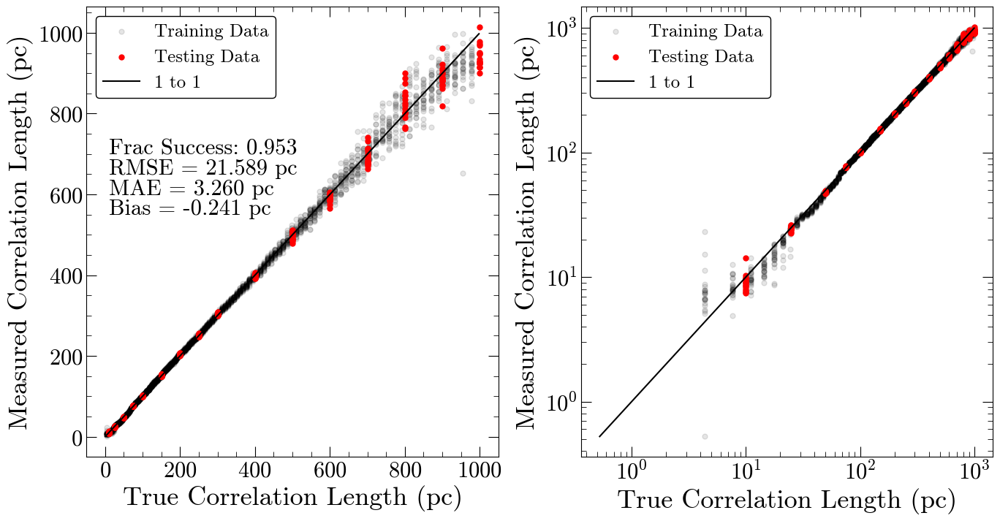

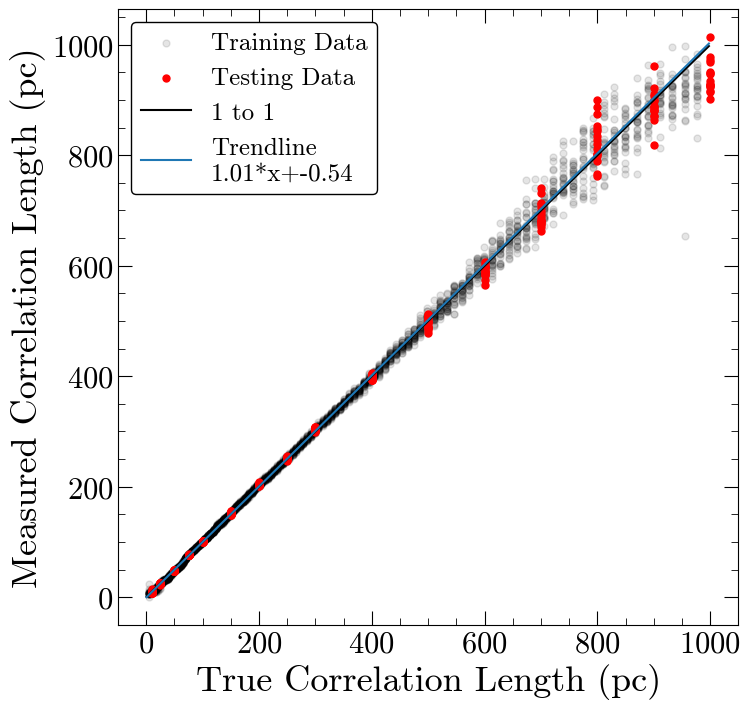

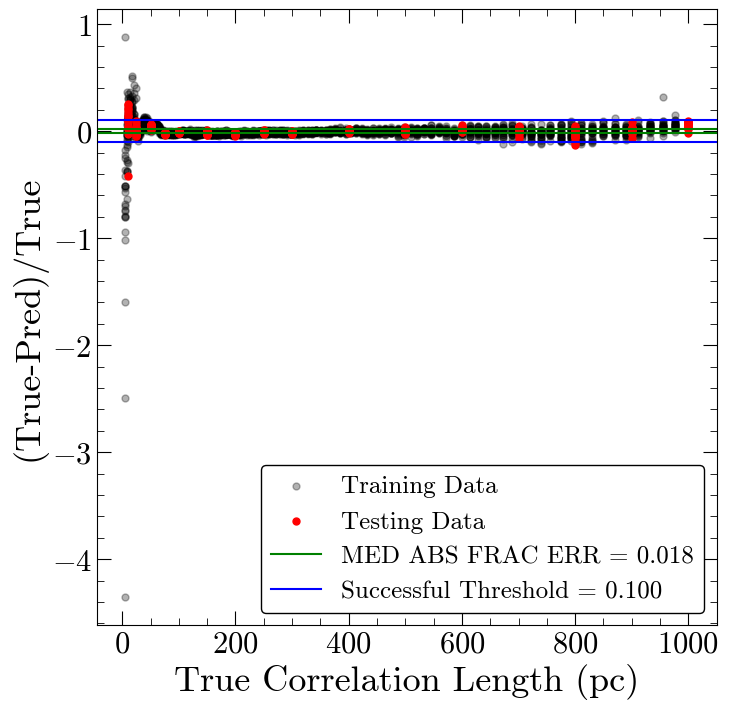

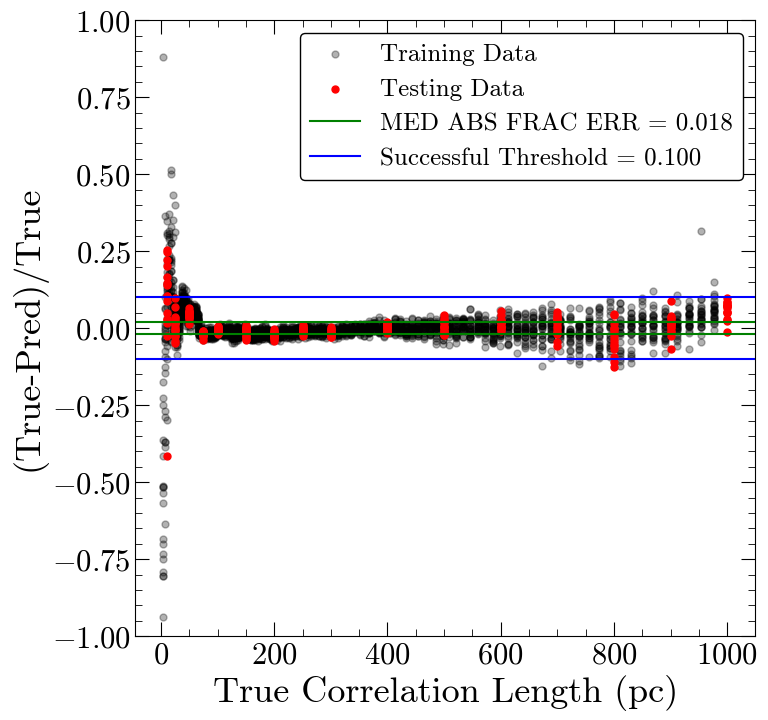

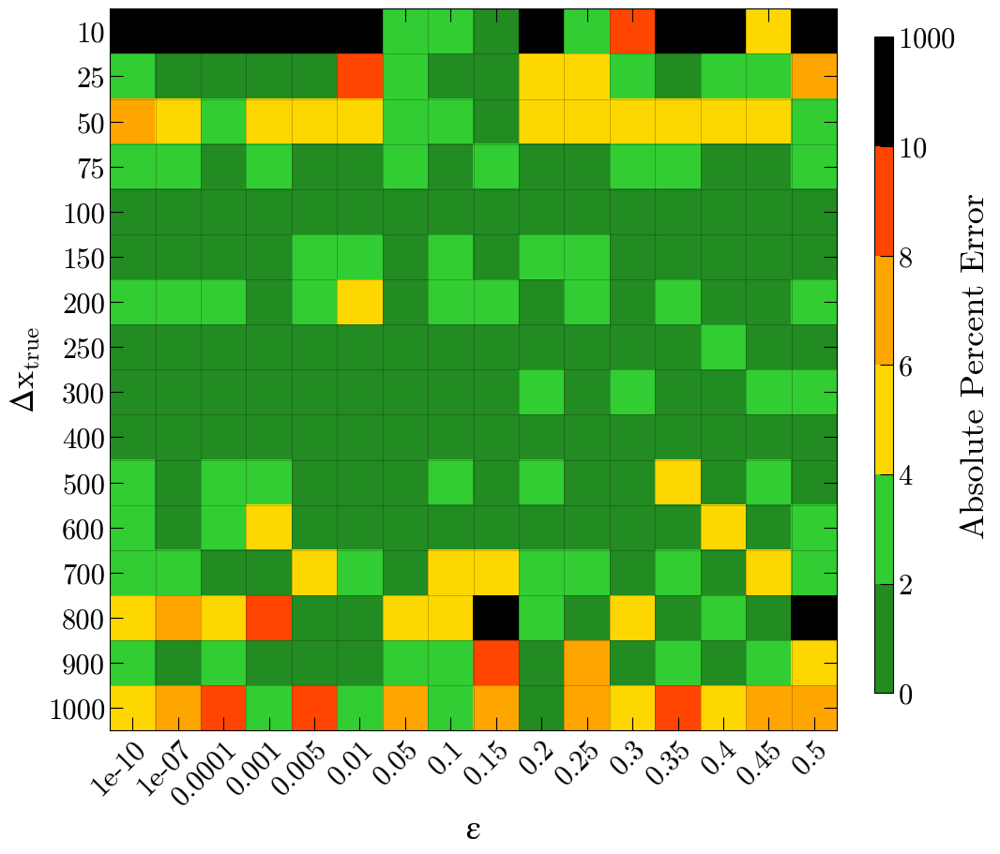

Number of squares with abs percent err>10%,  12


In [37]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 8ms/step - loss: 84650.0703
Epoch 2/200
92/92 [==============================] - 1s 7ms/step - loss: 4641.7827
Epoch 3/200
92/92 [==============================] - 1s 7ms/step - loss: 680.5675
Epoch 4/200
92/92 [==============================] - 1s 7ms/step - loss: 497.7545
Epoch 5/200
92/92 [==============================] - 1s 8ms/step - loss: 433.2621
Epoch 6/200
92/92 [==============================] - 1s 7ms/step - loss: 455.8378
Epoch 7/200
92/92 [==============================] - 1s 7ms/step - loss: 403.2672
Epoch 8/200
92/92 [==============================] - 1s 7ms/step - loss: 421.3857
Epoch 9/200
92/92 [==============================] - 1s 8ms/step - loss: 385.2155
Epoch 10/200
92/92 [==============================] - 1s 8ms/step - loss: 452.7609
Epoch 11/200
92/92 [==============================] - 1s 8ms/step - loss: 386.4069
Epoch 12/200
92/92 [==============================] - 1s 11ms/step - loss: 392.1207
Epoch 13/

92/92 [==============================] - 1s 8ms/step - loss: 310.7553
Epoch 197/200
92/92 [==============================] - 1s 7ms/step - loss: 281.2761
Epoch 198/200
92/92 [==============================] - 1s 8ms/step - loss: 292.7641
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 287.9869
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 279.5434

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 15.552 pc
MAE: 3.833 pc
BIAS: 2.915 pc
MED FRAC ERR: 0.022 

Training Stats, Successful Fits
Frac Success Fit: 0.973 
RMSE: 14.041 pc
MAE: 3.845 pc
BIAS: 3.010 pc
MED FRAC ERR: 0.021 

Testing Stats
RMSE: 22.257 pc
MAE: 3.808 pc
BIAS: 2.694 pc
MED FRAC ERR: 0.022 

Testing Stats, Successful Fits
Frac Success Fit: 0.945 
RMSE: 20.180 pc
MAE: 3.980 pc
BIAS: 2.814 pc
MED FRAC ERR: 0.020 


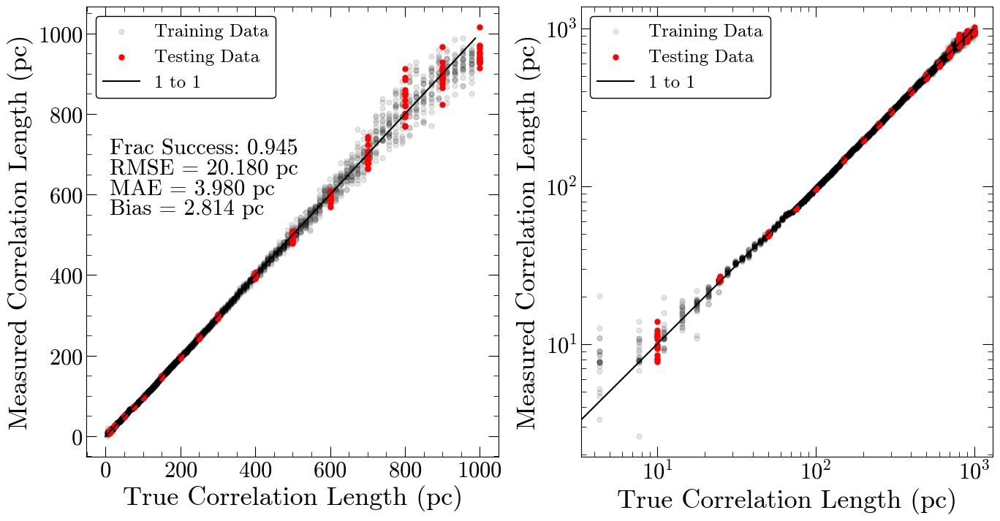

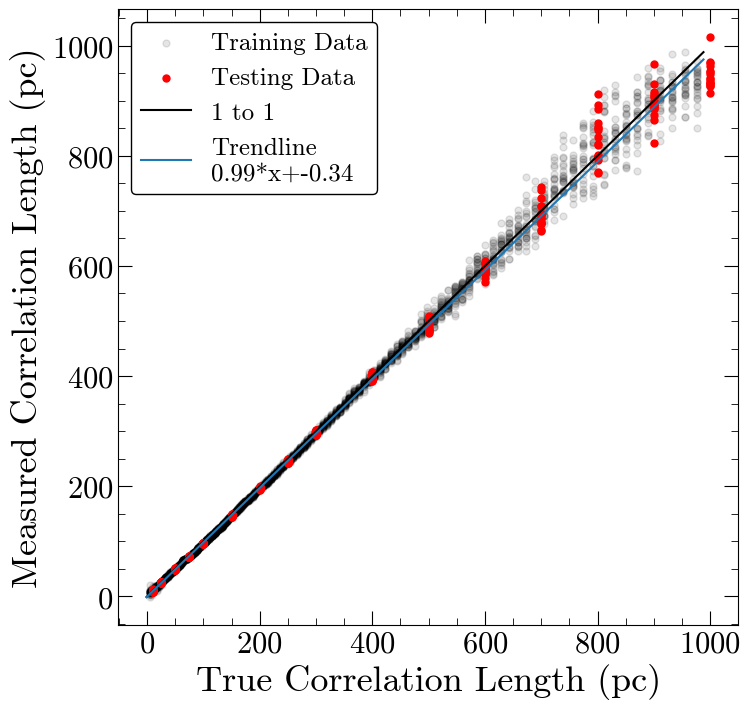

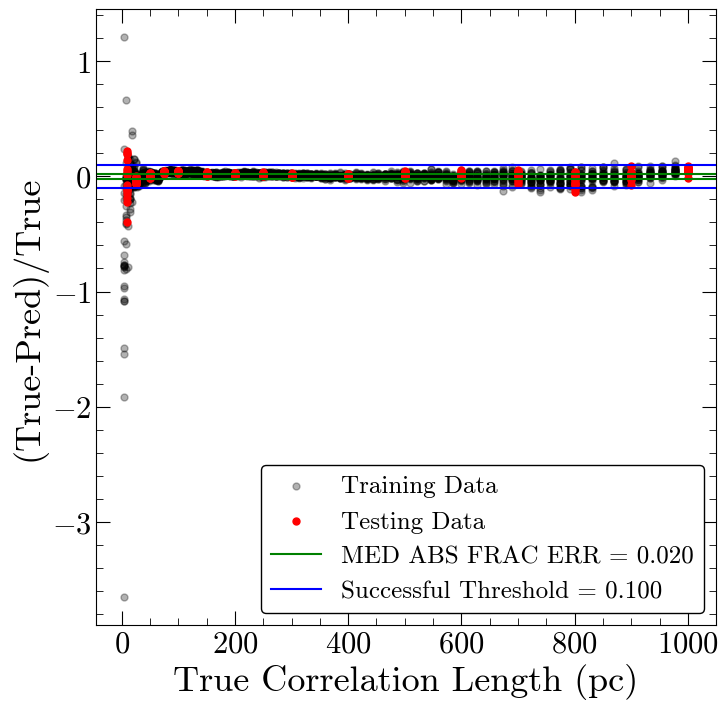

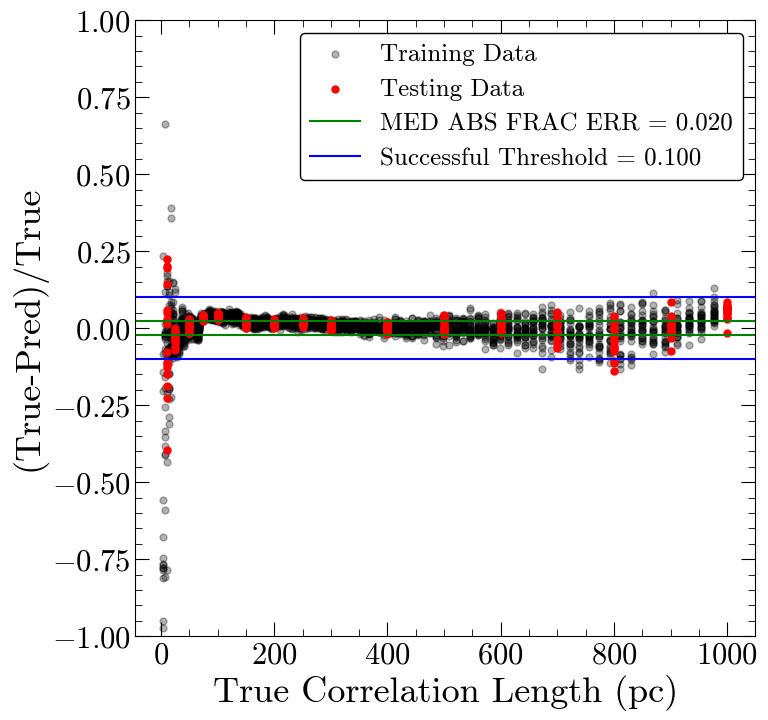

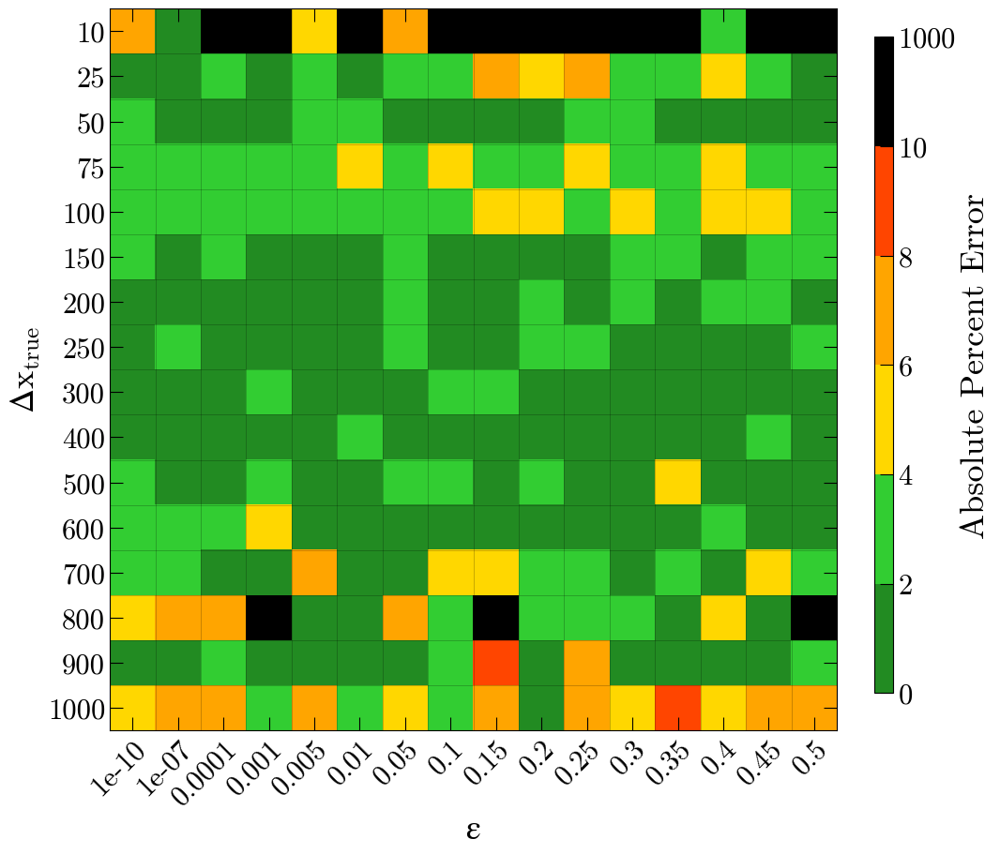

Number of squares with abs percent err>10%,  14


In [38]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 12ms/step - loss: 75446.8125
Epoch 2/400
92/92 [==============================] - 1s 9ms/step - loss: 2611.6453
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 946.3383
Epoch 4/400
92/92 [==============================] - 1s 9ms/step - loss: 658.4578
Epoch 5/400
92/92 [==============================] - 1s 9ms/step - loss: 480.8337
Epoch 6/400
92/92 [==============================] - 1s 10ms/step - loss: 412.3627
Epoch 7/400
92/92 [==============================] - 1s 9ms/step - loss: 382.9877
Epoch 8/400
92/92 [==============================] - 1s 9ms/step - loss: 380.7473
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 409.5769
Epoch 10/400
92/92 [==============================] - 1s 9ms/step - loss: 384.7342
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 377.9120
Epoch 12/400
92/92 [==============================] - 1s 10ms/step - loss: 375.7082
Epoch

92/92 [==============================] - 1s 10ms/step - loss: 279.1658
Epoch 196/400
92/92 [==============================] - 1s 9ms/step - loss: 290.0717
Epoch 197/400
92/92 [==============================] - 1s 11ms/step - loss: 271.7122
Epoch 198/400
92/92 [==============================] - 1s 9ms/step - loss: 273.4330
Epoch 199/400
92/92 [==============================] - 1s 9ms/step - loss: 317.9689
Epoch 200/400
92/92 [==============================] - 1s 10ms/step - loss: 289.4367
Epoch 201/400
92/92 [==============================] - 1s 8ms/step - loss: 280.6658
Epoch 202/400
92/92 [==============================] - 1s 8ms/step - loss: 316.8928
Epoch 203/400
92/92 [==============================] - 1s 8ms/step - loss: 269.3921
Epoch 204/400
92/92 [==============================] - 1s 8ms/step - loss: 280.8260
Epoch 205/400
92/92 [==============================] - 1s 9ms/step - loss: 276.3789
Epoch 206/400
92/92 [==============================] - 1s 8ms/step - loss: 272.3412
Epo

92/92 [==============================] - 1s 10ms/step - loss: 250.8032
Epoch 390/400
92/92 [==============================] - 1s 12ms/step - loss: 255.4534
Epoch 391/400
92/92 [==============================] - 1s 12ms/step - loss: 259.7700
Epoch 392/400
92/92 [==============================] - 1s 11ms/step - loss: 266.0053
Epoch 393/400
92/92 [==============================] - 1s 11ms/step - loss: 251.4772
Epoch 394/400
92/92 [==============================] - 1s 10ms/step - loss: 268.6117
Epoch 395/400
92/92 [==============================] - 1s 11ms/step - loss: 270.5331
Epoch 396/400
92/92 [==============================] - 1s 9ms/step - loss: 274.4492
Epoch 397/400
92/92 [==============================] - 1s 10ms/step - loss: 265.0068
Epoch 398/400
92/92 [==============================] - 1s 10ms/step - loss: 273.9135
Epoch 399/400
92/92 [==============================] - 1s 9ms/step - loss: 257.1673
Epoch 400/400
92/92 [==============================] - 1s 11ms/step - loss: 267.6

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 16.983 pc
MAE: 4.674 pc
BIAS: -3.711 pc
MED FRAC ERR: 0.023 

Training Stats, Successful Fits
Frac Success Fit: 0.969 
RMSE: 15.207 pc
MAE: 4.757 pc
BIAS: -3.837 pc
MED FRAC ERR: 0.023 

Testing Stats
RMSE: 22.035 pc
MAE: 5.570 pc
BIAS: -1.985 pc
MED FRAC ERR: 0.024 

Testing Stats, Successful Fits
Frac Success Fit: 0.934 
RMSE: 19.643 pc
MAE: 5.967 pc
BIAS: -2.160 pc
MED FRAC ERR: 0.022 


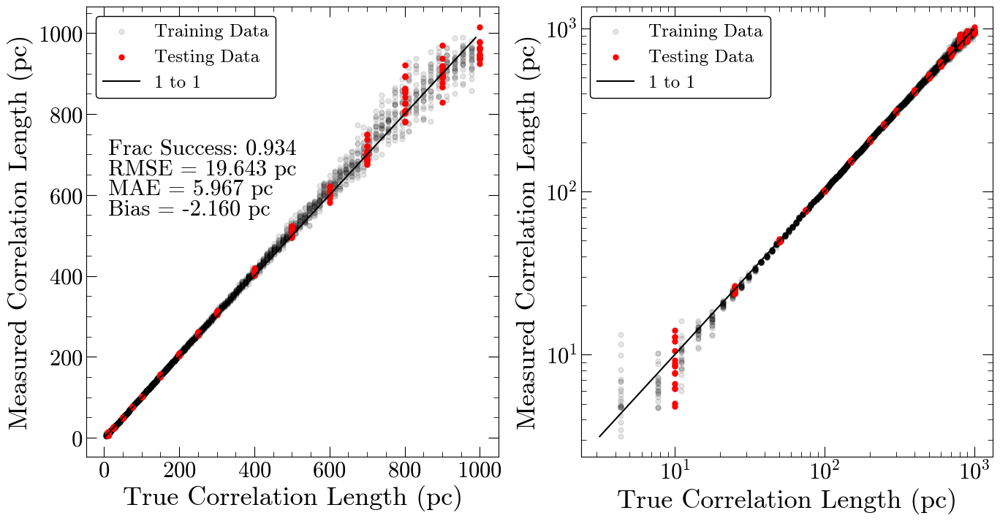

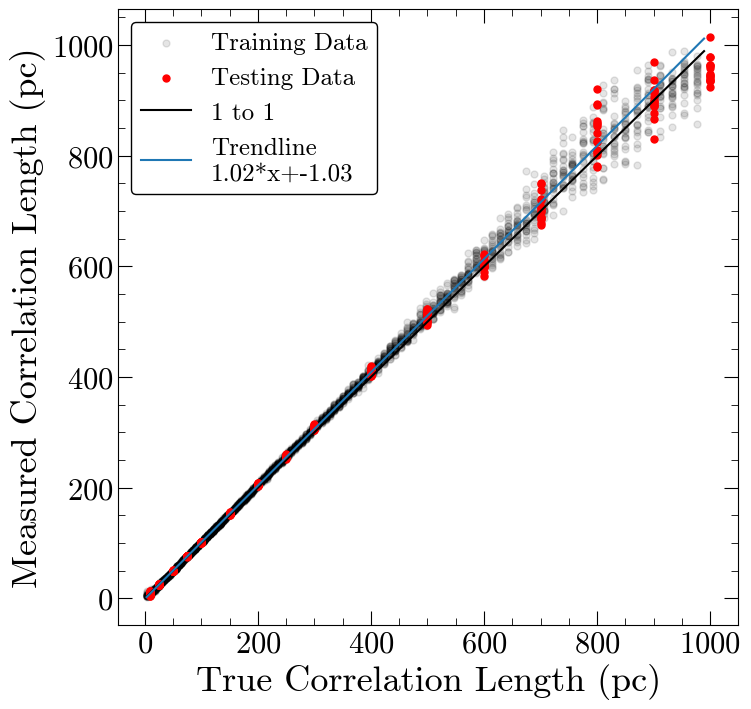

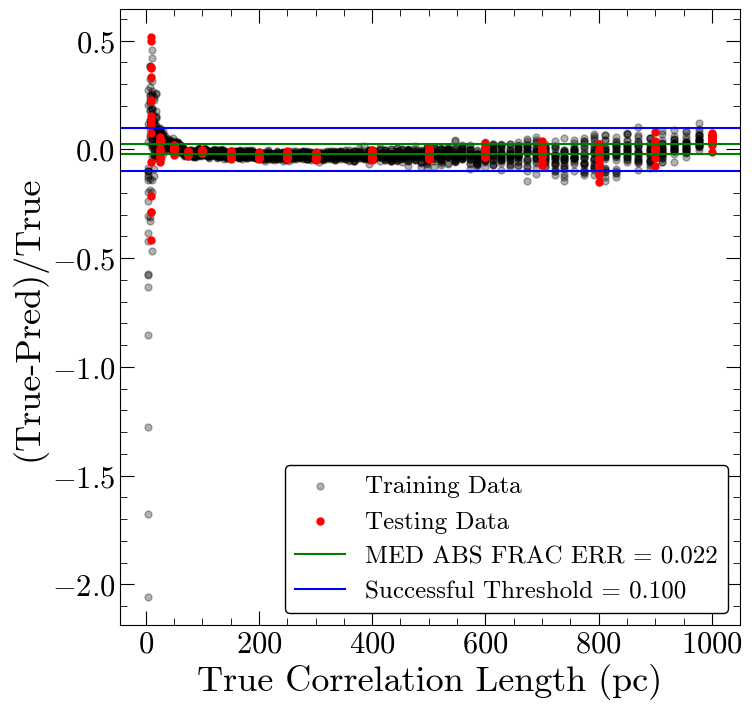

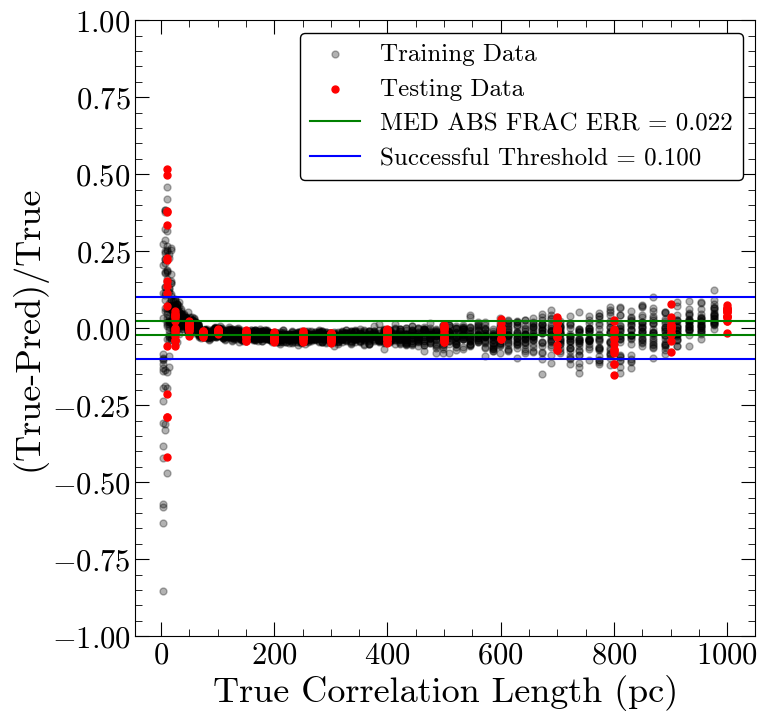

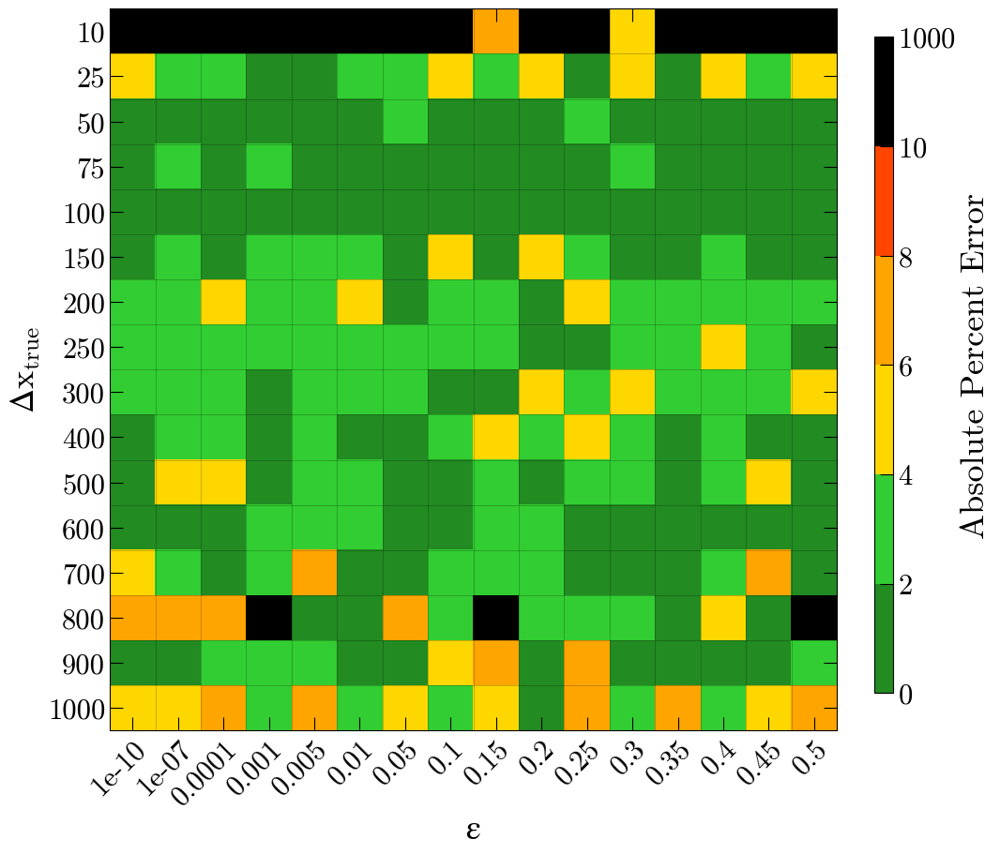

Number of squares with abs percent err>10%,  17


In [39]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 9ms/step - loss: 68671.2656
Epoch 2/400
92/92 [==============================] - 1s 11ms/step - loss: 1362.2421
Epoch 3/400
92/92 [==============================] - 1s 9ms/step - loss: 575.5489
Epoch 4/400
92/92 [==============================] - 1s 10ms/step - loss: 439.7041
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 415.8619
Epoch 6/400
92/92 [==============================] - 1s 9ms/step - loss: 403.1142
Epoch 7/400
92/92 [==============================] - 1s 11ms/step - loss: 376.1676
Epoch 8/400
92/92 [==============================] - 1s 11ms/step - loss: 390.6935
Epoch 9/400
92/92 [==============================] - 1s 9ms/step - loss: 482.7467
Epoch 10/400
92/92 [==============================] - 1s 11ms/step - loss: 467.2380
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 447.4214
Epoch 12/400
92/92 [==============================] - 1s 10ms/step - loss: 541.8185
Ep

Epoch 99/400
92/92 [==============================] - 1s 10ms/step - loss: 304.0817
Epoch 100/400
92/92 [==============================] - 1s 8ms/step - loss: 306.1566
Epoch 101/400
92/92 [==============================] - 1s 10ms/step - loss: 302.1945
Epoch 102/400
92/92 [==============================] - 1s 9ms/step - loss: 339.5666
Epoch 103/400
92/92 [==============================] - 1s 9ms/step - loss: 316.1927
Epoch 104/400
92/92 [==============================] - 1s 9ms/step - loss: 308.3256
Epoch 105/400
92/92 [==============================] - 1s 8ms/step - loss: 319.3678
Epoch 106/400
92/92 [==============================] - 1s 9ms/step - loss: 411.4459
Epoch 107/400
92/92 [==============================] - 1s 11ms/step - loss: 292.8440
Epoch 108/400
92/92 [==============================] - 1s 8ms/step - loss: 314.3534
Epoch 109/400
92/92 [==============================] - 1s 11ms/step - loss: 311.9389
Epoch 110/400
92/92 [==============================] - 1s 10ms/step - los

92/92 [==============================] - 1s 10ms/step - loss: 265.5429
Epoch 292/400
92/92 [==============================] - 1s 11ms/step - loss: 288.3738
Epoch 293/400
92/92 [==============================] - 1s 10ms/step - loss: 236.2382
Epoch 294/400
92/92 [==============================] - 1s 11ms/step - loss: 248.6806
Epoch 295/400
92/92 [==============================] - 1s 11ms/step - loss: 260.5219
Epoch 296/400
92/92 [==============================] - 1s 11ms/step - loss: 234.1007
Epoch 297/400
92/92 [==============================] - 1s 11ms/step - loss: 233.5859
Epoch 298/400
92/92 [==============================] - 1s 13ms/step - loss: 240.2427
Epoch 299/400
92/92 [==============================] - 1s 11ms/step - loss: 237.7717
Epoch 300/400
92/92 [==============================] - 1s 10ms/step - loss: 259.5436
Epoch 301/400
92/92 [==============================] - 1s 10ms/step - loss: 251.3522
Epoch 302/400
92/92 [==============================] - 1s 10ms/step - loss: 233

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 18.470 pc
MAE: 5.676 pc
BIAS: 5.255 pc
MED FRAC ERR: 0.027 

Training Stats, Successful Fits
Frac Success Fit: 0.972 
RMSE: 16.621 pc
MAE: 5.798 pc
BIAS: 5.340 pc
MED FRAC ERR: 0.027 

Testing Stats
RMSE: 26.460 pc
MAE: 6.669 pc
BIAS: 6.267 pc
MED FRAC ERR: 0.028 

Testing Stats, Successful Fits
Frac Success Fit: 0.953 
RMSE: 25.086 pc
MAE: 6.909 pc
BIAS: 6.504 pc
MED FRAC ERR: 0.026 


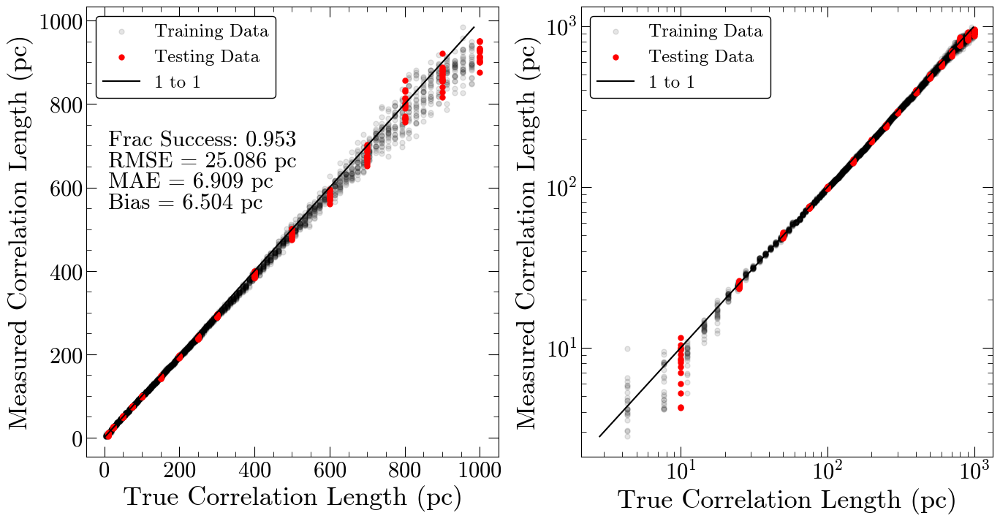

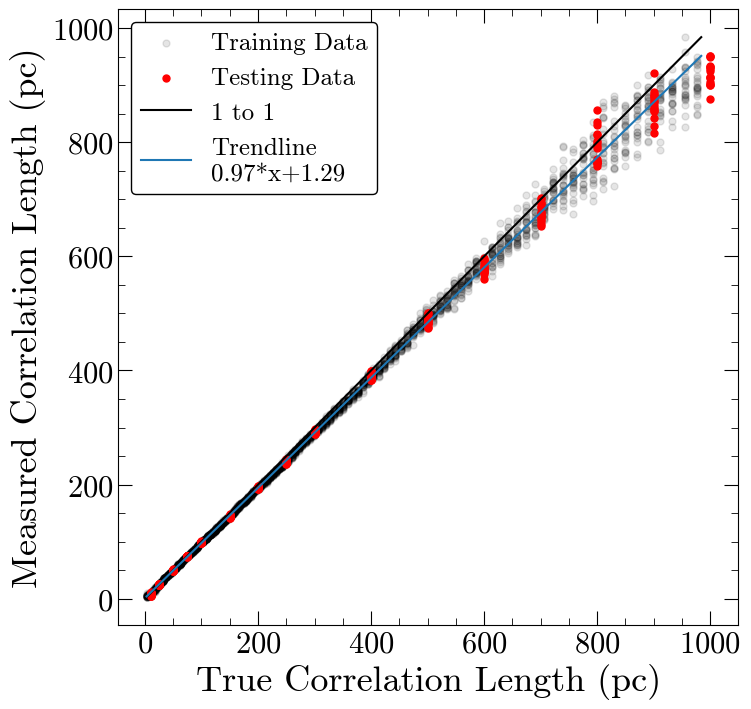

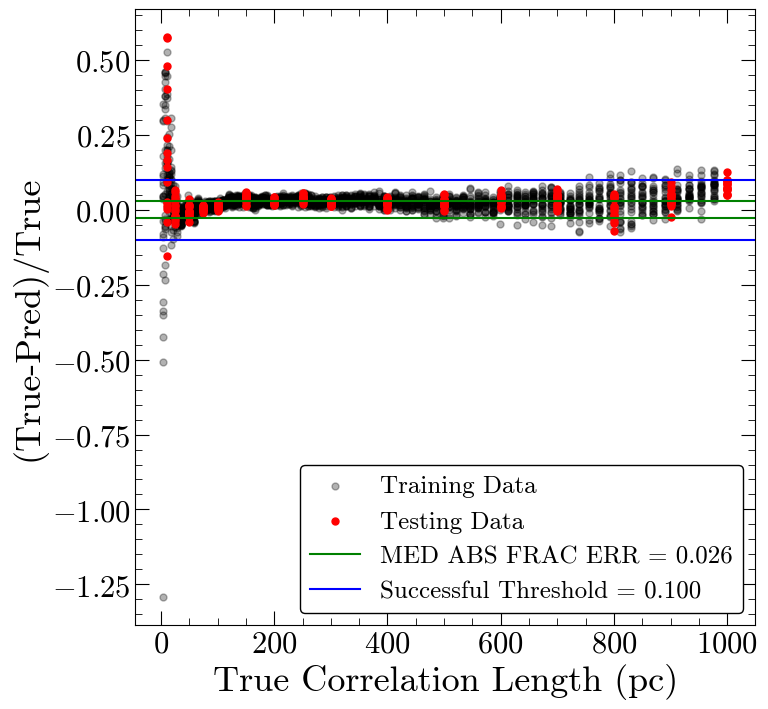

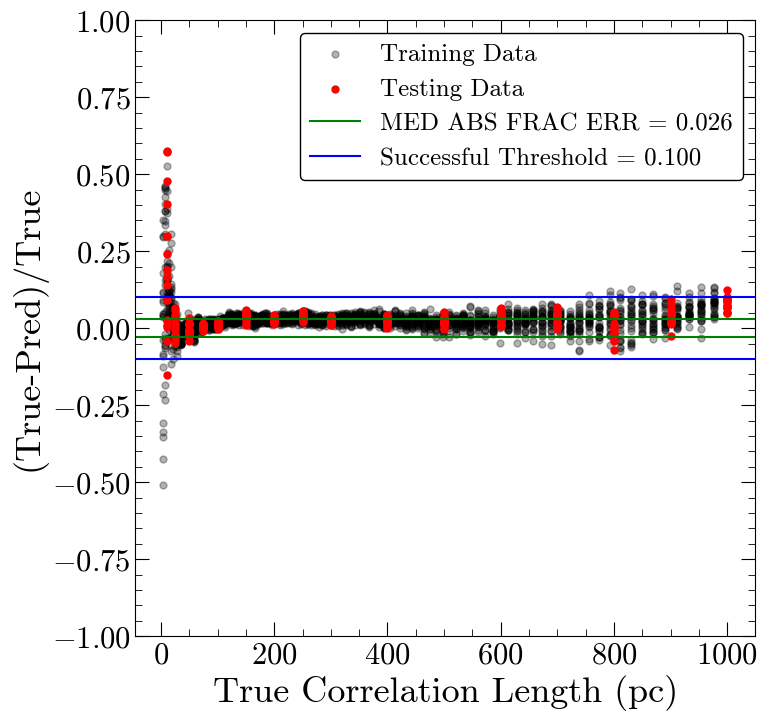

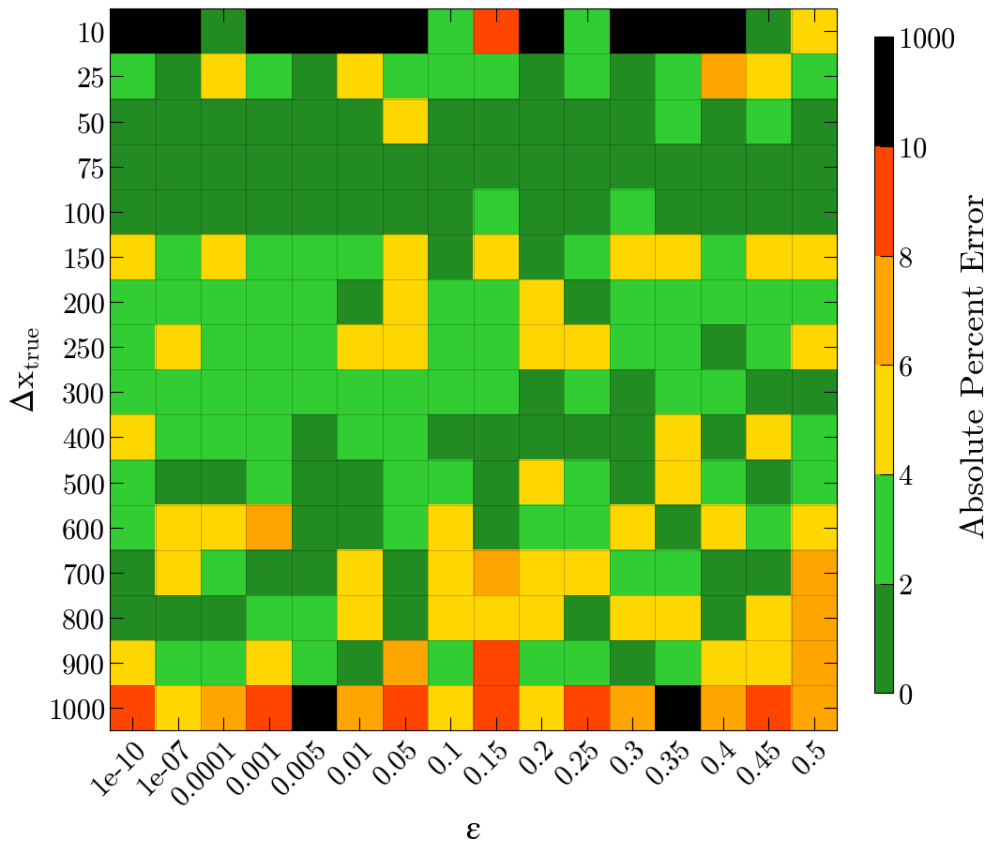

Number of squares with abs percent err>10%,  12


In [40]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 1s 14ms/step - loss: 121092.1484
Epoch 2/400
46/46 [==============================] - 1s 15ms/step - loss: 22563.9570
Epoch 3/400
46/46 [==============================] - 1s 14ms/step - loss: 1994.5625
Epoch 4/400
46/46 [==============================] - 1s 14ms/step - loss: 906.9849
Epoch 5/400
46/46 [==============================] - 1s 14ms/step - loss: 697.0662
Epoch 6/400
46/46 [==============================] - 1s 16ms/step - loss: 575.0562
Epoch 7/400
46/46 [==============================] - 1s 14ms/step - loss: 476.9495
Epoch 8/400
46/46 [==============================] - 1s 14ms/step - loss: 410.5636
Epoch 9/400
46/46 [==============================] - 1s 13ms/step - loss: 385.2900
Epoch 10/400
46/46 [==============================] - 1s 16ms/step - loss: 380.7617
Epoch 11/400
46/46 [==============================] - 1s 16ms/step - loss: 372.7299
Epoch 12/400
46/46 [==============================] - 1s 12ms/step - loss: 388.

46/46 [==============================] - 1s 14ms/step - loss: 272.8140
Epoch 195/400
46/46 [==============================] - 1s 14ms/step - loss: 266.4310
Epoch 196/400
46/46 [==============================] - 1s 13ms/step - loss: 229.6731
Epoch 197/400
46/46 [==============================] - 1s 12ms/step - loss: 250.2376
Epoch 198/400
46/46 [==============================] - 1s 14ms/step - loss: 239.3792
Epoch 199/400
46/46 [==============================] - 1s 13ms/step - loss: 264.8071
Epoch 200/400
46/46 [==============================] - 1s 15ms/step - loss: 245.8184
Epoch 201/400
46/46 [==============================] - 1s 15ms/step - loss: 251.7675
Epoch 202/400
46/46 [==============================] - 1s 13ms/step - loss: 237.4882
Epoch 203/400
46/46 [==============================] - 1s 18ms/step - loss: 269.8206
Epoch 204/400
46/46 [==============================] - 1s 15ms/step - loss: 249.4846
Epoch 205/400
46/46 [==============================] - 1s 13ms/step - loss: 274

46/46 [==============================] - 0s 10ms/step - loss: 244.2631
Epoch 387/400
46/46 [==============================] - 0s 10ms/step - loss: 236.6393
Epoch 388/400
46/46 [==============================] - 0s 11ms/step - loss: 211.0731
Epoch 389/400
46/46 [==============================] - 0s 10ms/step - loss: 223.2846
Epoch 390/400
46/46 [==============================] - 0s 9ms/step - loss: 222.1003
Epoch 391/400
46/46 [==============================] - 1s 12ms/step - loss: 206.4668
Epoch 392/400
46/46 [==============================] - 0s 9ms/step - loss: 276.6721
Epoch 393/400
46/46 [==============================] - 0s 10ms/step - loss: 225.6839
Epoch 394/400
46/46 [==============================] - 0s 9ms/step - loss: 230.4015
Epoch 395/400
46/46 [==============================] - 0s 10ms/step - loss: 223.6121
Epoch 396/400
46/46 [==============================] - 1s 11ms/step - loss: 228.3286
Epoch 397/400
46/46 [==============================] - 0s 10ms/step - loss: 268.98

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 14.765 pc
MAE: 2.678 pc
BIAS: 2.190 pc
MED FRAC ERR: 0.017 

Training Stats, Successful Fits
Frac Success Fit: 0.975 
RMSE: 13.957 pc
MAE: 2.706 pc
BIAS: 2.219 pc
MED FRAC ERR: 0.017 

Testing Stats
RMSE: 21.500 pc
MAE: 2.863 pc
BIAS: 2.168 pc
MED FRAC ERR: 0.019 

Testing Stats, Successful Fits
Frac Success Fit: 0.957 
RMSE: 20.797 pc
MAE: 2.919 pc
BIAS: 2.159 pc
MED FRAC ERR: 0.018 


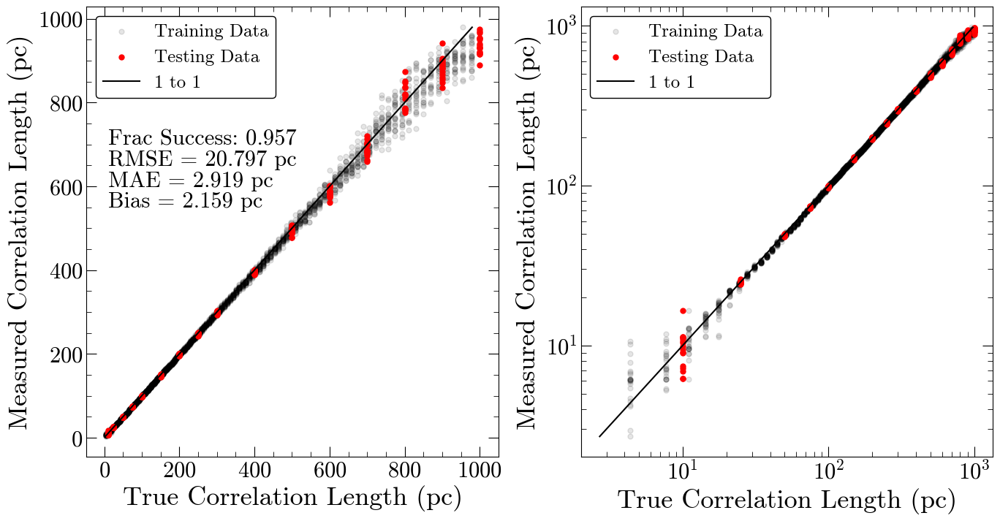

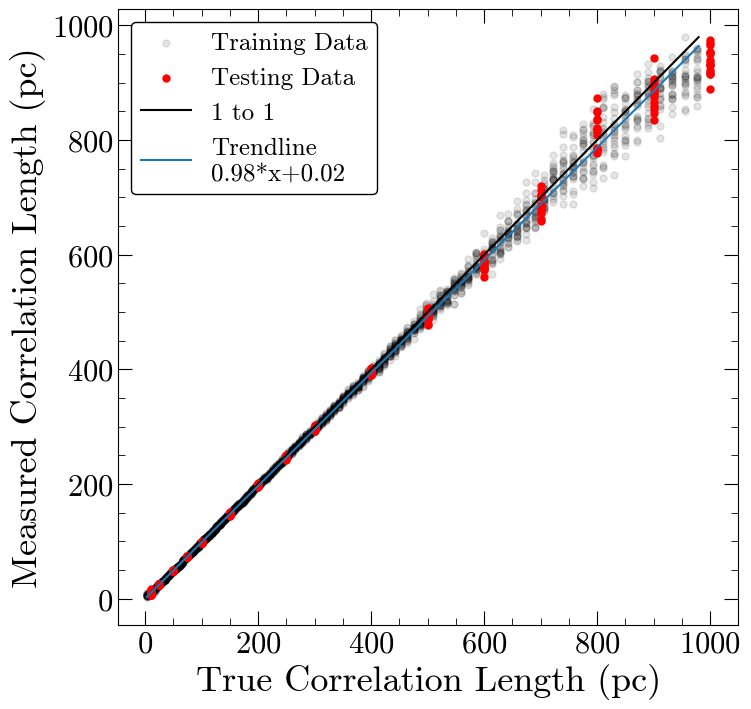

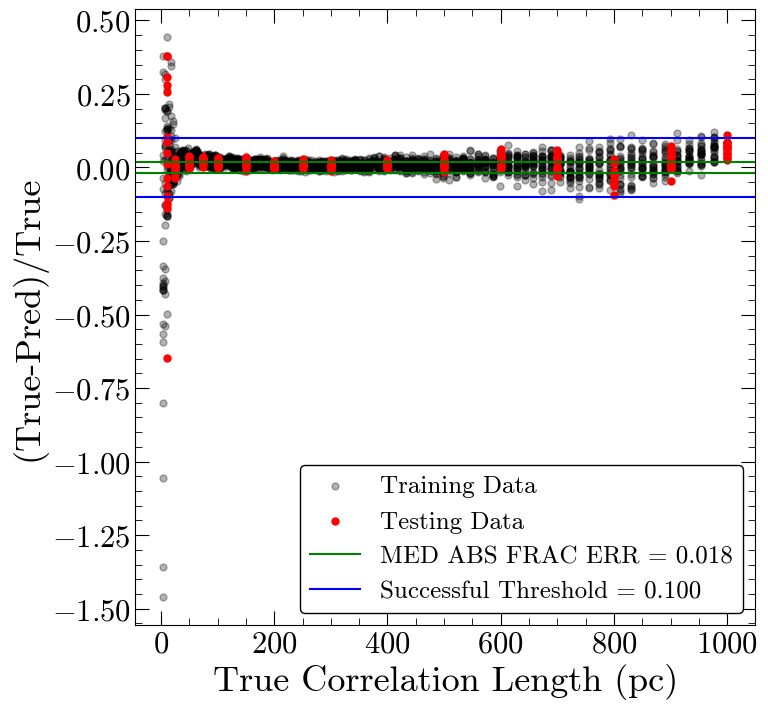

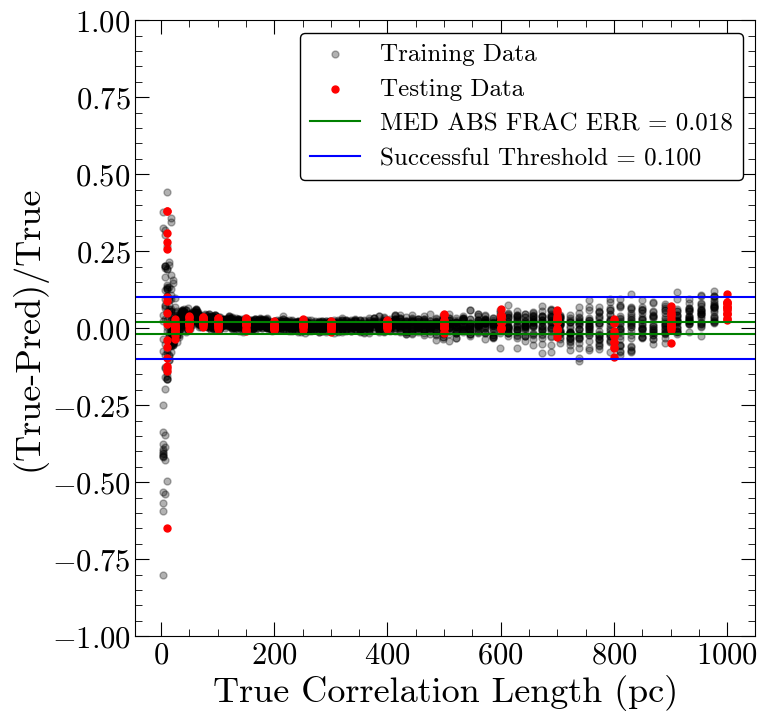

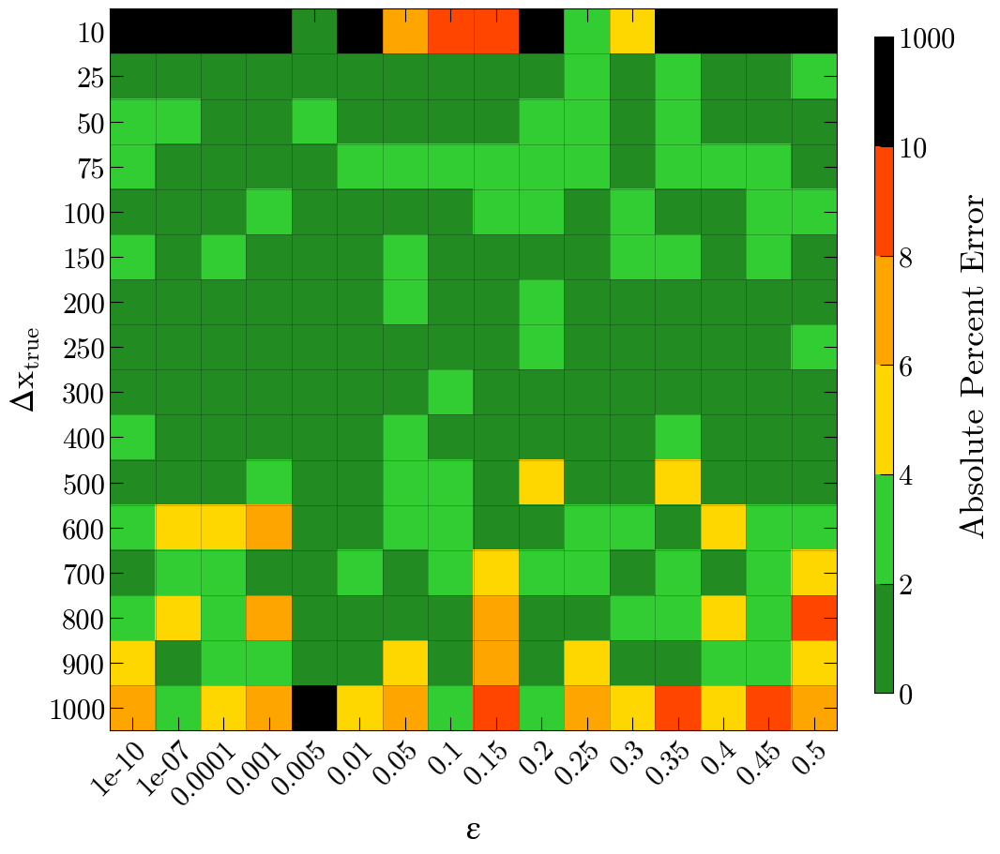

Number of squares with abs percent err>10%,  11


In [41]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 1s 32ms/step - loss: 164209.5781
Epoch 2/400
10/10 [==============================] - 0s 28ms/step - loss: 161440.2344
Epoch 3/400
10/10 [==============================] - 0s 19ms/step - loss: 139196.4688
Epoch 4/400
10/10 [==============================] - 0s 28ms/step - loss: 66735.8203
Epoch 5/400
10/10 [==============================] - 0s 41ms/step - loss: 46235.6172
Epoch 6/400
10/10 [==============================] - 0s 48ms/step - loss: 33167.9609
Epoch 7/400
10/10 [==============================] - 0s 49ms/step - loss: 21216.7148
Epoch 8/400
10/10 [==============================] - 0s 27ms/step - loss: 11152.9902
Epoch 9/400
10/10 [==============================] - 0s 38ms/step - loss: 4282.8140
Epoch 10/400
10/10 [==============================] - 0s 28ms/step - loss: 2396.3708
Epoch 11/400
10/10 [==============================] - 0s 27ms/step - loss: 2217.0728
Epoch 12/400
10/10 [==============================] - 0s 21ms/s

10/10 [==============================] - 0s 26ms/step - loss: 311.4753
Epoch 195/400
10/10 [==============================] - 0s 29ms/step - loss: 321.2314
Epoch 196/400
10/10 [==============================] - 0s 23ms/step - loss: 326.9066
Epoch 197/400
10/10 [==============================] - 0s 23ms/step - loss: 292.9620
Epoch 198/400
10/10 [==============================] - 0s 24ms/step - loss: 284.6619
Epoch 199/400
10/10 [==============================] - 0s 24ms/step - loss: 285.1366
Epoch 200/400
10/10 [==============================] - 0s 25ms/step - loss: 291.7721
Epoch 201/400
10/10 [==============================] - 0s 23ms/step - loss: 294.1000
Epoch 202/400
10/10 [==============================] - 0s 25ms/step - loss: 297.9579
Epoch 203/400
10/10 [==============================] - 0s 22ms/step - loss: 279.8357
Epoch 204/400
10/10 [==============================] - 0s 21ms/step - loss: 281.4120
Epoch 205/400
10/10 [==============================] - 0s 19ms/step - loss: 279

10/10 [==============================] - 0s 14ms/step - loss: 231.1590
Epoch 387/400
10/10 [==============================] - 0s 16ms/step - loss: 229.1697
Epoch 388/400
10/10 [==============================] - 0s 14ms/step - loss: 239.4308
Epoch 389/400
10/10 [==============================] - 0s 15ms/step - loss: 232.3139
Epoch 390/400
10/10 [==============================] - 0s 15ms/step - loss: 225.8140
Epoch 391/400
10/10 [==============================] - 0s 14ms/step - loss: 239.3305
Epoch 392/400
10/10 [==============================] - 0s 18ms/step - loss: 230.3895
Epoch 393/400
10/10 [==============================] - 0s 17ms/step - loss: 237.4820
Epoch 394/400
10/10 [==============================] - 0s 16ms/step - loss: 243.8655
Epoch 395/400
10/10 [==============================] - 0s 15ms/step - loss: 240.0065
Epoch 396/400
10/10 [==============================] - 0s 15ms/step - loss: 234.0686
Epoch 397/400
10/10 [==============================] - 0s 16ms/step - loss: 226

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 15.161 pc
MAE: 1.814 pc
BIAS: -0.803 pc
MED FRAC ERR: 0.011 

Training Stats, Successful Fits
Frac Success Fit: 0.964 
RMSE: 13.685 pc
MAE: 1.732 pc
BIAS: -0.838 pc
MED FRAC ERR: 0.010 

Testing Stats
RMSE: 20.355 pc
MAE: 2.916 pc
BIAS: -0.291 pc
MED FRAC ERR: 0.014 

Testing Stats, Successful Fits
Frac Success Fit: 0.934 
RMSE: 19.313 pc
MAE: 2.656 pc
BIAS: -0.359 pc
MED FRAC ERR: 0.013 


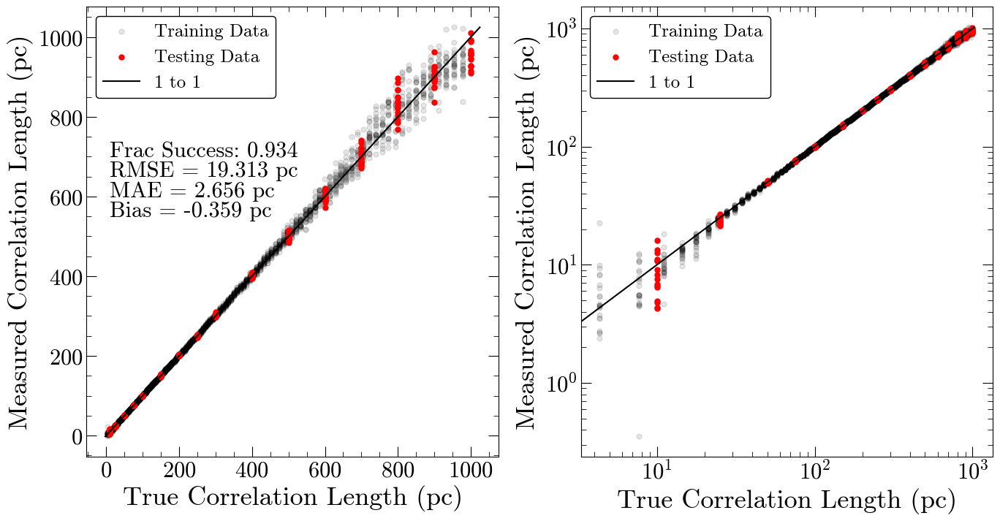

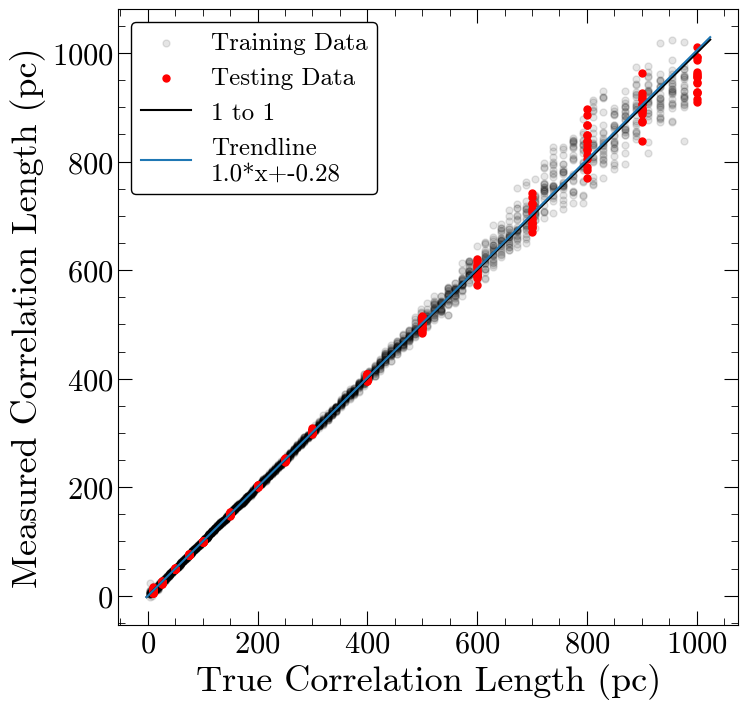

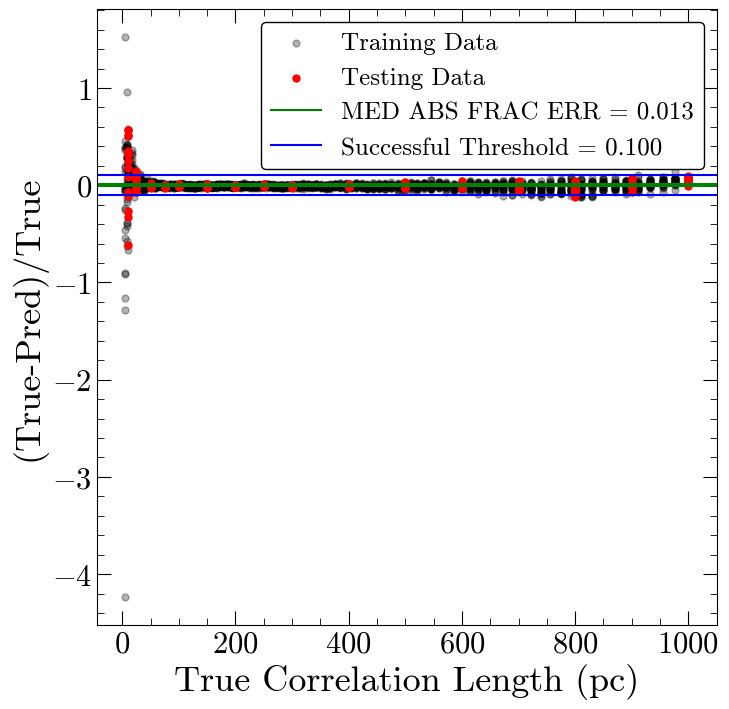

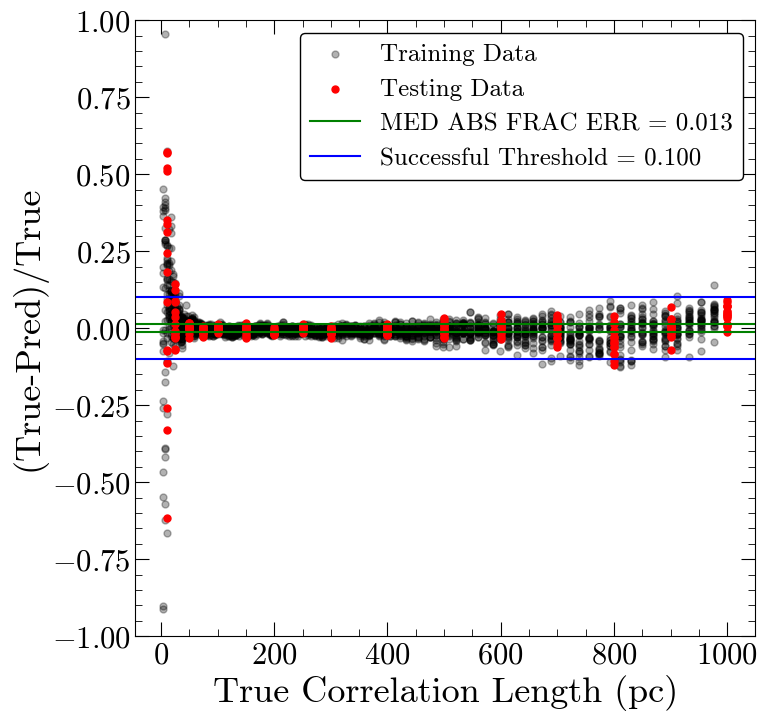

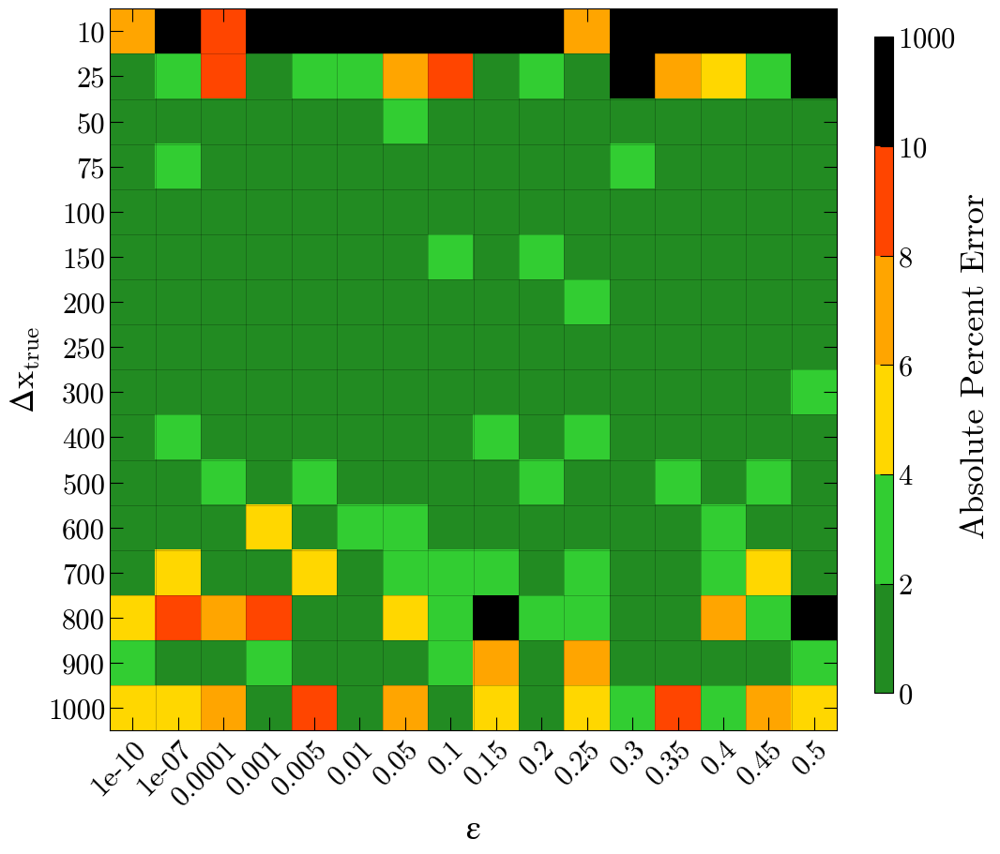

Number of squares with abs percent err>10%,  17


In [42]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [43]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 9


Min MAE Training
10 , min val= 1.81

Max Frac Success Training
9 , max val= 0.98

Min MAE Testing
9 , min val= 2.86

Max Frac Success Testing
9 , max val= 0.96



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,3.57,0.96,3.52,0.93
1,4.78,0.95,6.15,0.93
2,8.90,0.93,8.03,0.89
3,4.92,0.97,4.76,0.94
4,4.86,0.94,5.51,0.91
5,2.85,0.96,3.09,0.95
6,3.83,0.97,3.81,0.95
7,4.67,0.97,5.57,0.93
8,5.68,0.97,6.67,0.95
9,2.68,0.98,2.86,0.96


In [45]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>12:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 10ms/step - loss: 69017.9453
Epoch 2/400
92/92 [==============================] - 1s 10ms/step - loss: 1430.3739
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 640.2362
Epoch 4/400
92/92 [==============================] - 1s 11ms/step - loss: 487.6286
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 443.8486
Epoch 6/400
92/92 [==============================] - 2s 17ms/step - loss: 388.8220
Epoch 7/400
92/92 [==============================] - 1s 8ms/step - loss: 473.3044
Epoch 8/400
92/92 [==============================] - 1s 11ms/step - loss: 436.8394
Epoch 9/400
92/92 [==============================] - 1s 11ms/step - loss: 411.6540
Epoch 10/400
92/92 [==============================] - 1s 11ms/step - loss: 425.5549
Epoch 11/400
92/92 [==============================] - 1s 11ms/step - loss: 395.4805
Epoch 12/400
92/92 [==============================] - 1s 11ms/step - loss: 434.2615

92/92 [==============================] - 1s 14ms/step - loss: 351.2190
Epoch 195/400
92/92 [==============================] - 1s 14ms/step - loss: 344.5452
Epoch 196/400
92/92 [==============================] - 1s 13ms/step - loss: 347.4706
Epoch 197/400
92/92 [==============================] - 2s 17ms/step - loss: 284.3748
Epoch 198/400
92/92 [==============================] - 2s 18ms/step - loss: 309.0428
Epoch 199/400
92/92 [==============================] - 1s 13ms/step - loss: 293.6920
Epoch 200/400
92/92 [==============================] - 2s 16ms/step - loss: 325.1622
Epoch 201/400
92/92 [==============================] - 1s 13ms/step - loss: 372.5402
Epoch 202/400
92/92 [==============================] - 1s 12ms/step - loss: 357.1153
Epoch 203/400
92/92 [==============================] - 1s 14ms/step - loss: 318.0858
Epoch 204/400
92/92 [==============================] - 1s 13ms/step - loss: 405.2800
Epoch 205/400
92/92 [==============================] - 1s 13ms/step - loss: 423

92/92 [==============================] - 1s 12ms/step - loss: 247.8312
Epoch 387/400
92/92 [==============================] - 1s 14ms/step - loss: 285.5937
Epoch 388/400
92/92 [==============================] - 1s 14ms/step - loss: 266.8982
Epoch 389/400
92/92 [==============================] - 1s 13ms/step - loss: 248.3101
Epoch 390/400
92/92 [==============================] - 1s 13ms/step - loss: 253.7636
Epoch 391/400
92/92 [==============================] - 1s 13ms/step - loss: 249.7968
Epoch 392/400
92/92 [==============================] - 1s 13ms/step - loss: 266.1106
Epoch 393/400
92/92 [==============================] - 1s 12ms/step - loss: 257.5514
Epoch 394/400
92/92 [==============================] - 1s 13ms/step - loss: 244.4057
Epoch 395/400
92/92 [==============================] - 1s 13ms/step - loss: 262.9488
Epoch 396/400
92/92 [==============================] - 1s 13ms/step - loss: 274.7935
Epoch 397/400
92/92 [==============================] - 1s 12ms/step - loss: 253

92/92 [==============================] - 1s 13ms/step - loss: 294.6396
Epoch 180/400
92/92 [==============================] - 1s 10ms/step - loss: 329.9300
Epoch 181/400
92/92 [==============================] - 1s 10ms/step - loss: 369.6721
Epoch 182/400
92/92 [==============================] - 1s 10ms/step - loss: 305.8858
Epoch 183/400
92/92 [==============================] - 1s 11ms/step - loss: 294.0561
Epoch 184/400
92/92 [==============================] - 1s 11ms/step - loss: 259.8541
Epoch 185/400
92/92 [==============================] - 1s 10ms/step - loss: 272.5759
Epoch 186/400
92/92 [==============================] - 1s 10ms/step - loss: 295.2589
Epoch 187/400
92/92 [==============================] - 1s 11ms/step - loss: 310.5569
Epoch 188/400
92/92 [==============================] - 1s 10ms/step - loss: 307.5035
Epoch 189/400
92/92 [==============================] - 1s 9ms/step - loss: 293.1580
Epoch 190/400
92/92 [==============================] - 1s 9ms/step - loss: 289.8

92/92 [==============================] - 1s 8ms/step - loss: 264.5466
Epoch 277/400
92/92 [==============================] - 1s 7ms/step - loss: 245.4073
Epoch 278/400
92/92 [==============================] - 1s 8ms/step - loss: 301.1479
Epoch 279/400
92/92 [==============================] - 1s 9ms/step - loss: 342.2547
Epoch 280/400
92/92 [==============================] - 1s 8ms/step - loss: 275.5403
Epoch 281/400
92/92 [==============================] - 1s 9ms/step - loss: 248.2086
Epoch 282/400
92/92 [==============================] - 1s 9ms/step - loss: 274.3521
Epoch 283/400
92/92 [==============================] - 1s 8ms/step - loss: 251.9936
Epoch 284/400
92/92 [==============================] - 1s 9ms/step - loss: 266.7607
Epoch 285/400
92/92 [==============================] - 1s 9ms/step - loss: 256.1069
Epoch 286/400
92/92 [==============================] - 1s 8ms/step - loss: 258.6134
Epoch 287/400
92/92 [==============================] - 1s 8ms/step - loss: 259.7551
Epoch 

92/92 [==============================] - 1s 6ms/step - loss: 351.7556
Epoch 72/400
92/92 [==============================] - 1s 6ms/step - loss: 404.4927
Epoch 73/400
92/92 [==============================] - 1s 6ms/step - loss: 424.1298
Epoch 74/400
92/92 [==============================] - 0s 5ms/step - loss: 372.8370
Epoch 75/400
92/92 [==============================] - 1s 6ms/step - loss: 444.8645
Epoch 76/400
92/92 [==============================] - 1s 7ms/step - loss: 406.1611
Epoch 77/400
92/92 [==============================] - 1s 6ms/step - loss: 365.2864
Epoch 78/400
92/92 [==============================] - 1s 8ms/step - loss: 435.1388
Epoch 79/400
92/92 [==============================] - 1s 5ms/step - loss: 417.5217
Epoch 80/400
92/92 [==============================] - 0s 5ms/step - loss: 394.9692
Epoch 81/400
92/92 [==============================] - 1s 8ms/step - loss: 399.5135
Epoch 82/400
92/92 [==============================] - 1s 7ms/step - loss: 480.8893
Epoch 83/400
92/9

Epoch 169/400
92/92 [==============================] - 0s 5ms/step - loss: 313.9353
Epoch 170/400
92/92 [==============================] - 1s 6ms/step - loss: 318.8605
Epoch 171/400
92/92 [==============================] - 1s 7ms/step - loss: 353.7789
Epoch 172/400
92/92 [==============================] - 1s 7ms/step - loss: 304.1131
Epoch 173/400
92/92 [==============================] - 1s 7ms/step - loss: 291.1376
Epoch 174/400
92/92 [==============================] - 1s 7ms/step - loss: 363.0347
Epoch 175/400
92/92 [==============================] - 1s 6ms/step - loss: 313.9988
Epoch 176/400
92/92 [==============================] - 1s 7ms/step - loss: 283.6734
Epoch 177/400
92/92 [==============================] - 1s 6ms/step - loss: 331.7209
Epoch 178/400
92/92 [==============================] - 1s 6ms/step - loss: 336.2617
Epoch 179/400
92/92 [==============================] - 1s 6ms/step - loss: 337.1445
Epoch 180/400
92/92 [==============================] - 1s 7ms/step - loss: 3

92/92 [==============================] - 1s 8ms/step - loss: 228.0659
Epoch 364/400
92/92 [==============================] - 1s 12ms/step - loss: 230.4571
Epoch 365/400
92/92 [==============================] - 1s 8ms/step - loss: 229.8322
Epoch 366/400
92/92 [==============================] - 1s 8ms/step - loss: 270.4820
Epoch 367/400
92/92 [==============================] - 1s 8ms/step - loss: 225.7766
Epoch 368/400
92/92 [==============================] - 1s 9ms/step - loss: 216.7004
Epoch 369/400
92/92 [==============================] - 1s 9ms/step - loss: 265.9690
Epoch 370/400
92/92 [==============================] - 1s 9ms/step - loss: 266.6451
Epoch 371/400
92/92 [==============================] - 1s 9ms/step - loss: 219.7637
Epoch 372/400
92/92 [==============================] - 1s 8ms/step - loss: 226.3021
Epoch 373/400
92/92 [==============================] - 1s 8ms/step - loss: 235.6805
Epoch 374/400
92/92 [==============================] - 1s 9ms/step - loss: 267.1201
Epoch

In [46]:
#save the model
nb='07'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/07_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/07_final_model/assets


In [49]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

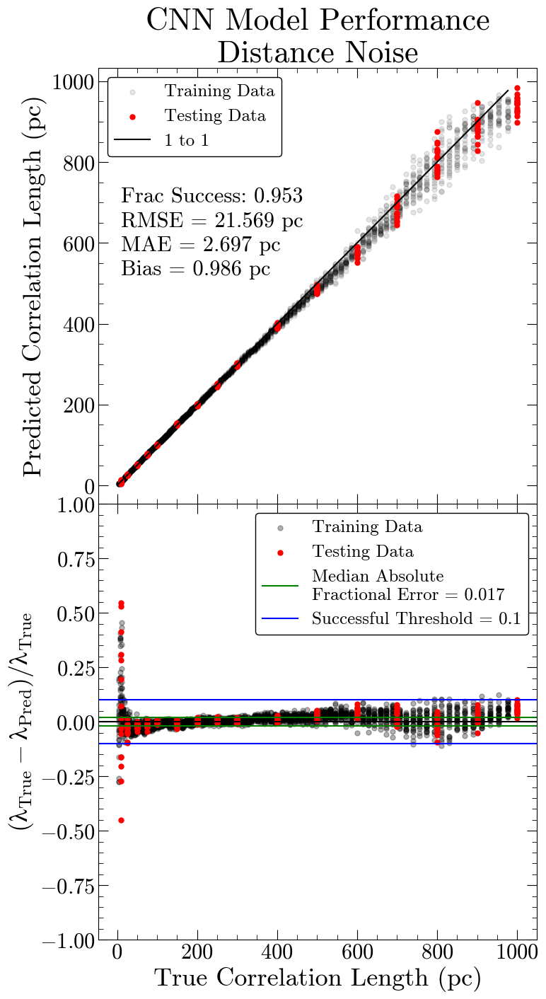

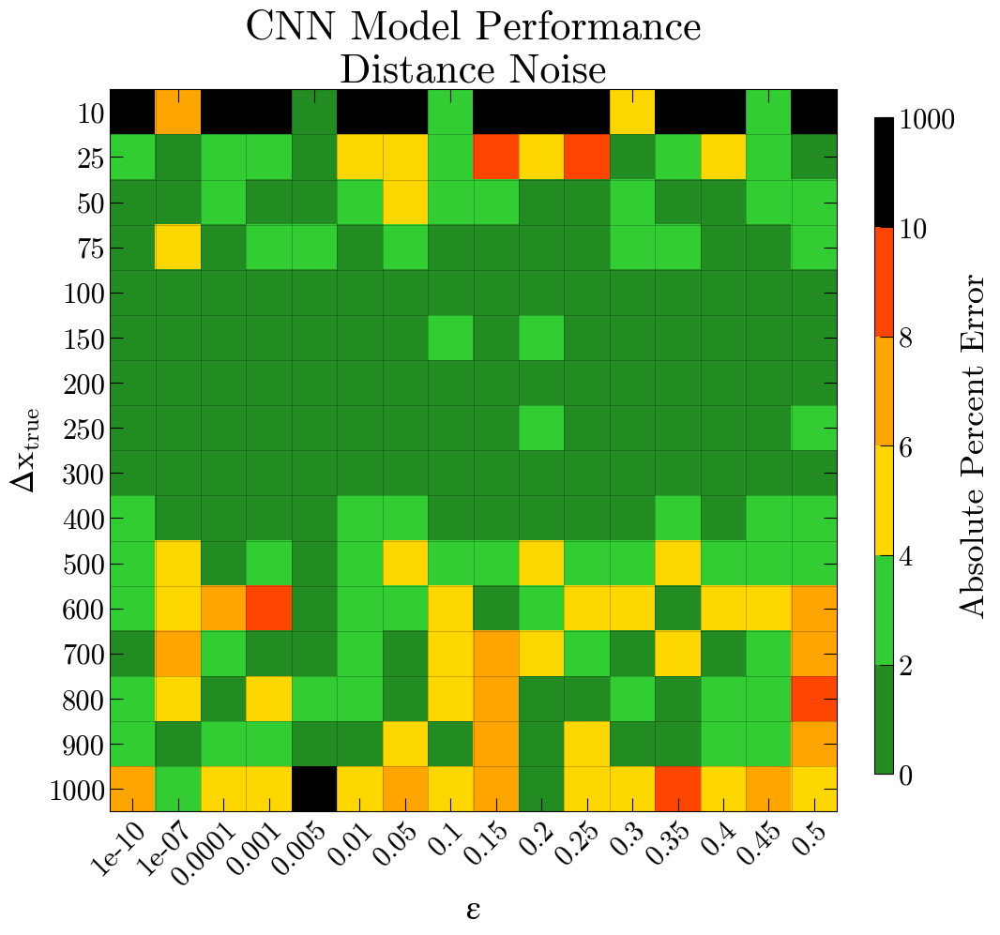

Number of squares with abs percent err>10%,  12


In [50]:
final_plot('07','CNN Model Performance\nDistance Noise',statdy=60)